In [43]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

# Data Preparation

In [44]:
custom_tickers = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "REGN", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]
study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

### Random Selection

In [45]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.575839,0.062209,1.149531,0.373724,"[JBHT, INTC, ADBE, ADP, SRCL, REGN, ADBE, TXN,..."
period_1 (4 stocks),0.749156,0.051308,1.582663,0.414855,"[MSFT, CTSH, MAR, TXN, ISRG, AMZN, SIRI, INTU,..."
period_1 (8 stocks),0.725393,0.045108,1.670771,0.207897,"[ORCL, TSCO, INTU, FAST, MAT, ORLY, MAR, VRSN,..."
period_2 (2 stocks),0.801308,0.036109,2.004317,0.141456,"[MNST, MAT, ORCL, ORLY, TXN, ORLY, EA, NTAP, A..."
period_2 (4 stocks),1.007747,0.031101,3.084602,0.444211,"[REGN, AAPL, EA, WBA, INTC, CSCO, KLAC, CTSH, ..."
period_2 (8 stocks),0.851934,0.026875,3.109660,0.245262,"[XRAY, INCY, ILMN, ROST, BIIB, VRSN, TSCO, EA,..."
period_3 (2 stocks),0.202320,0.050495,0.398739,0.533981,"[MSFT, MAR, MNST, SHPG, ISRG, GILD, EBAY, ADP,..."
period_3 (4 stocks),0.216739,0.043770,0.502013,0.328277,"[MSFT, BIIB, XRAY, CSCO, SIRI, NTAP, ORLY, AAP..."
period_3 (8 stocks),0.217060,0.040835,0.529161,0.356649,"[VRTX, VOD, WBA, NVDA, EA, CSCO, TXN, MAR, MAR..."
period_4 (2 stocks),0.976563,0.033670,2.947237,0.118083,"[INTC, PCAR, SRCL, ADP, EA, EBAY, ORLY, VRTX, ..."


### Hierarchical Clustering

In [46]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

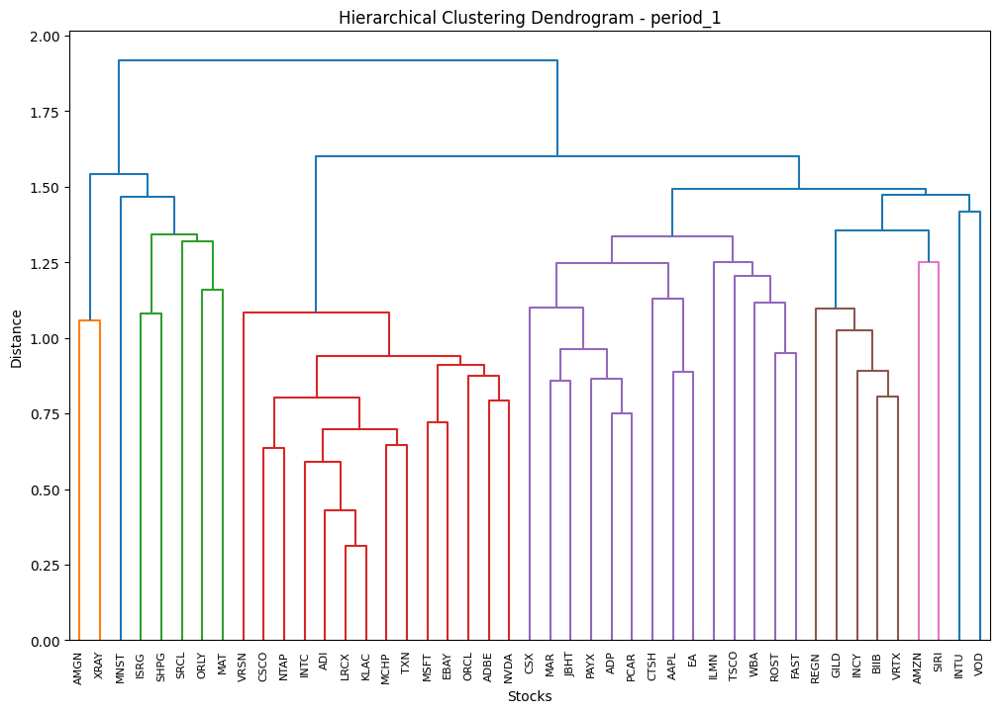

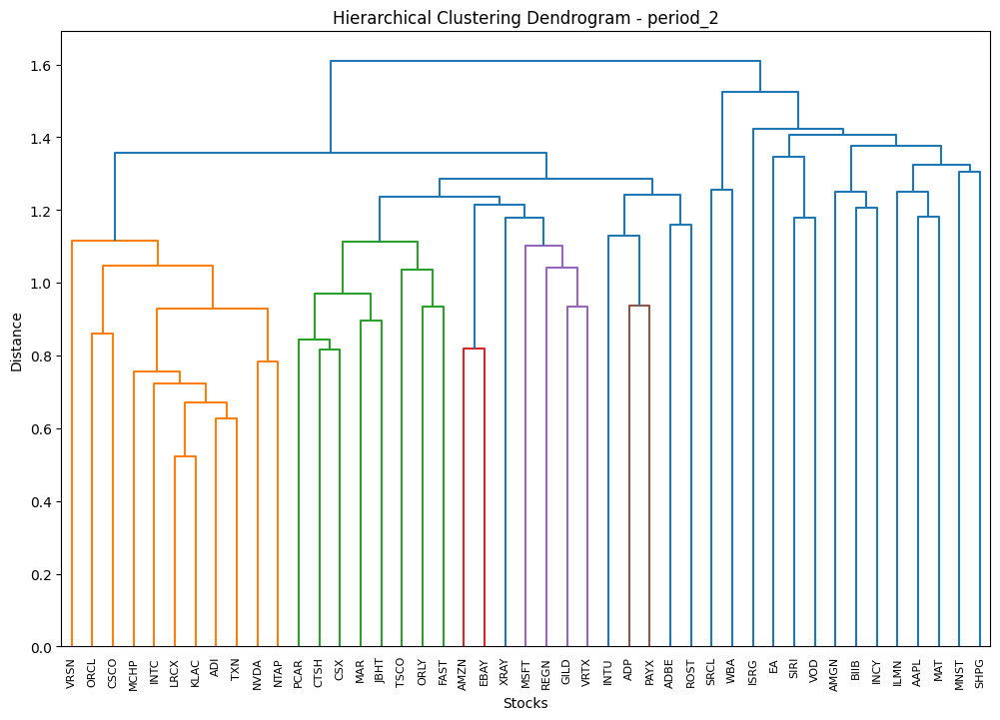

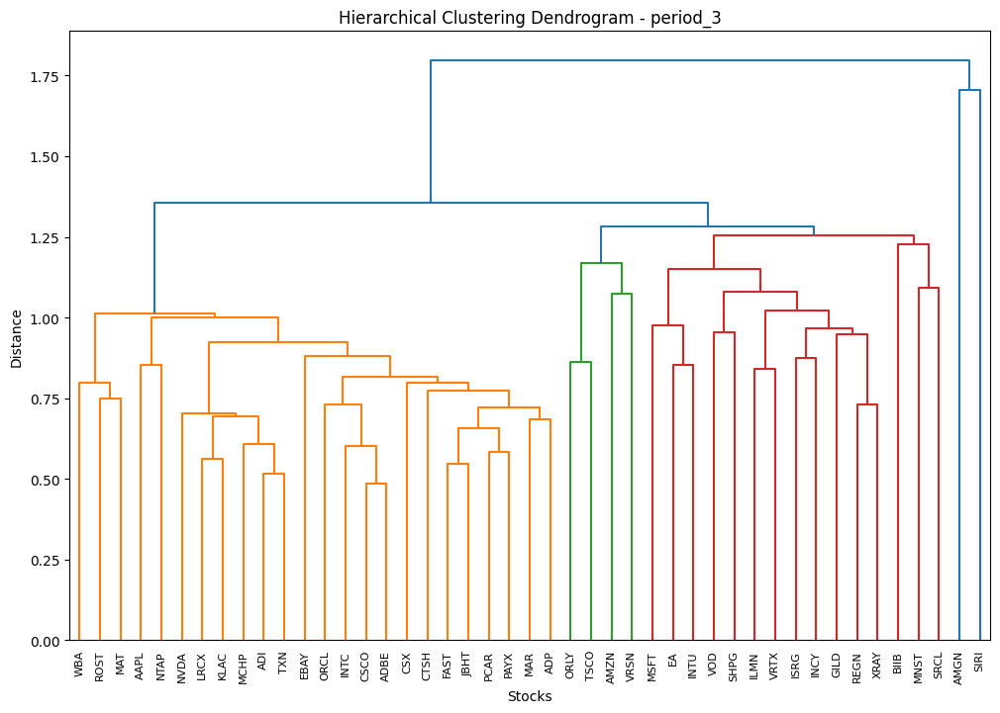

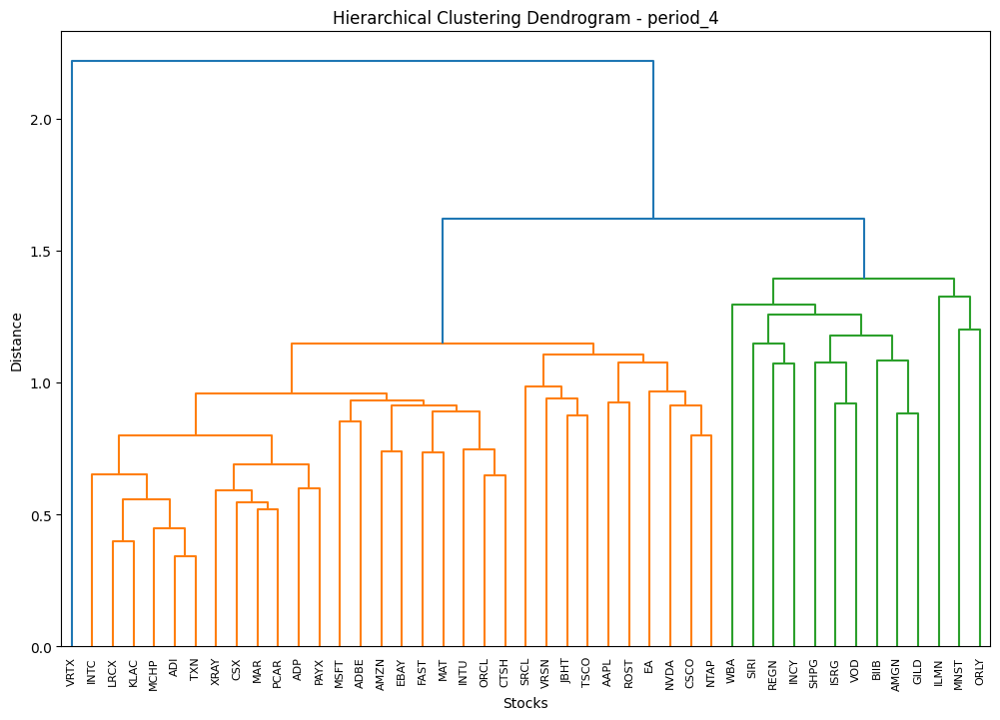

In [47]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [48]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [49]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.362070,0.066874,0.695444,0.181650,"[XRAY, LRCX, ILMN, VRSN, INTU, ORCL, MAT, TXN,..."
period_1 (4 stocks),0.545263,0.048827,1.142191,0.232994,"[GILD, KLAC, WBA, CSX, INTU, MCHP, ORLY, PAYX,..."
period_1 (8 stocks),0.810052,0.043100,1.907053,0.220464,"[VOD, VRSN, MCHP, AMGN, GILD, MNST, TSCO, CSX,..."
period_2 (2 stocks),1.260638,0.037576,2.818449,0.017645,"[MNST, INTC, BIIB, JBHT, ILMN, LRCX, SIRI, INC..."
period_2 (4 stocks),0.927165,0.032832,2.640170,0.253979,"[WBA, GILD, PAYX, CSCO, SRCL, REGN, JBHT, TXN,..."
period_2 (8 stocks),0.654947,0.024475,2.630162,0.214768,"[AMGN, VRTX, ADP, LRCX, CSCO, PCAR, VOD, WBA, ..."
period_3 (2 stocks),0.260697,0.047680,0.520556,0.225641,"[ADBE, ISRG, EA, SHPG, INTU, GILD, EBAY, MNST,..."
period_3 (4 stocks),0.270363,0.044391,0.604059,0.339930,"[AAPL, REGN, MCHP, ILMN, ROST, AMZN, ADBE, ILM..."
period_3 (8 stocks),0.057376,0.040822,0.136186,0.326985,"[NTAP, SHPG, TXN, ORCL, AMGN, MNST, TSCO, SIRI..."
period_4 (2 stocks),1.444242,0.034882,4.191178,0.347942,"[KLAC, GILD, ADBE, REGN, JBHT, GILD, CSCO, ORL..."


### K-Means

In [50]:
from sklearn.cluster import KMeans
import numpy as np

In [51]:
periods = ['period_1','period_2','period_3','period_4']

In [52]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [53]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [54]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.923509,0.062879,1.618981,0.301290,"[MAT, INTC, ADP, TSCO, ORLY, TXN, WBA, TXN, VR..."
period_1 (4 stocks),0.655578,0.050637,1.417286,0.134419,"[VOD, AMZN, CSX, ORLY, VRTX, EBAY, SRCL, ORLY,..."
period_1 (8 stocks),0.778277,0.043336,1.819400,0.203869,"[ISRG, CSCO, PCAR, SHPG, MCHP, MNST, VRTX, AAP..."
period_2 (2 stocks),0.935419,0.036630,2.234970,0.017645,"[LRCX, VRSN, NVDA, PAYX, CSX, REGN, INTC, SIRI..."
period_2 (4 stocks),1.210992,0.033007,3.441036,0.221770,"[AAPL, MSFT, ORCL, REGN, MAT, JBHT, NVDA, EA, ..."
period_2 (8 stocks),1.035596,0.026181,3.913318,0.191468,"[LRCX, EBAY, CSX, MNST, ORLY, AMZN, AAPL, ISRG..."
period_3 (2 stocks),0.181000,0.048780,0.360865,0.330783,"[ADP, INTU, INTC, VOD, ADBE, REGN, MCHP, GILD,..."
period_3 (4 stocks),0.206367,0.043409,0.466525,0.378068,"[PCAR, REGN, TXN, MSFT, JBHT, ISRG, ADI, INTU,..."
period_3 (8 stocks),0.316034,0.039384,0.795872,0.373340,"[AMZN, CSCO, WBA, CTSH, ROST, INTC, BIIB, TSCO..."
period_4 (2 stocks),1.191881,0.033940,3.490562,0.426665,"[ILMN, WBA, SIRI, CSX, ROST, PAYX, SRCL, ADI, ..."


In [55]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [56]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [57]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.215358,0.081922,0.262882,0.300087,"[ILMN, MSFT]"
period_1 (4 stocks),0.463037,0.048472,0.955261,0.295580,"[INCY, MSFT, JBHT, ORLY]"
period_1 (8 stocks),1.446916,0.047583,3.040826,0.244488,"[ORLY, EBAY, JBHT, REGN, INTC, MNST, ILMN, CTSH]"
period_2 (2 stocks),0.465786,0.025783,1.806555,0.247714,"[PCAR, MAT]"
period_2 (4 stocks),0.733929,0.040343,1.819218,0.281454,"[VOD, FAST, NVDA, REGN]"
period_2 (8 stocks),0.900604,0.023757,3.790939,0.206569,"[NVDA, MSFT, FAST, SHPG, MAT, ADP, VOD, ISRG]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ROST, ILMN]"
period_3 (4 stocks),0.254708,0.046489,0.547889,0.424547,"[ADP, ILMN, NVDA, INTU]"
period_3 (8 stocks),0.952503,0.045585,2.089498,0.390419,"[AMZN, AAPL, ISRG, EBAY, ROST, NVDA, BIIB, ILMN]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[SHPG, AMZN]"


### Minimum Spanning Trees

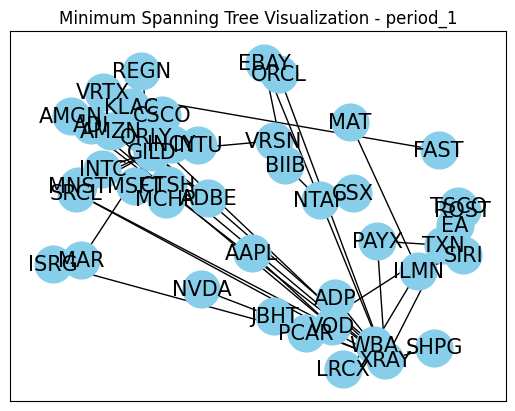

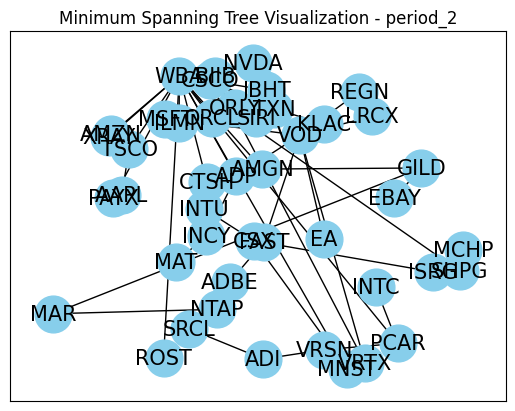

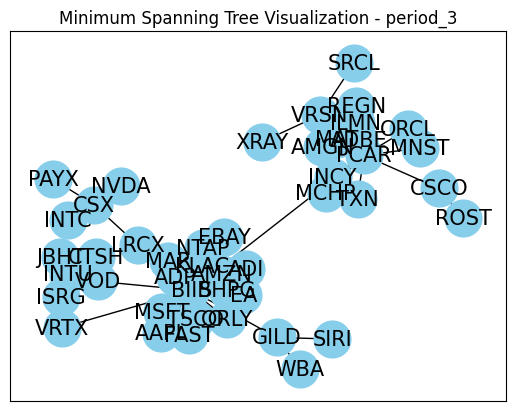

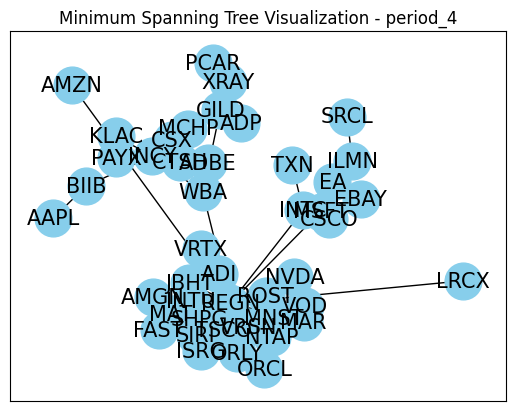

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


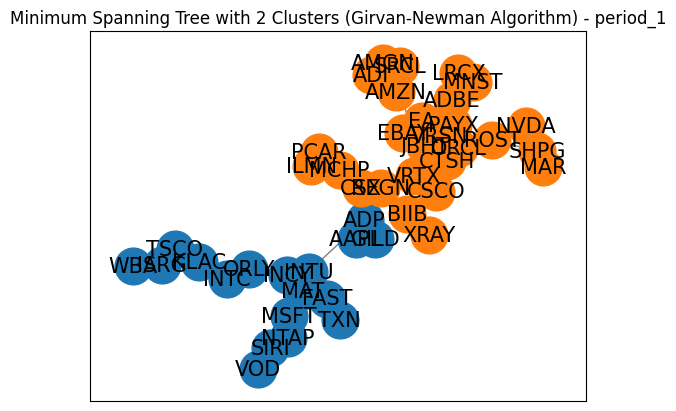

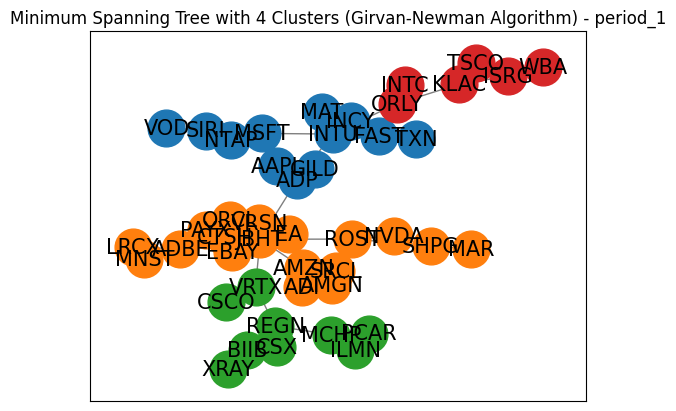

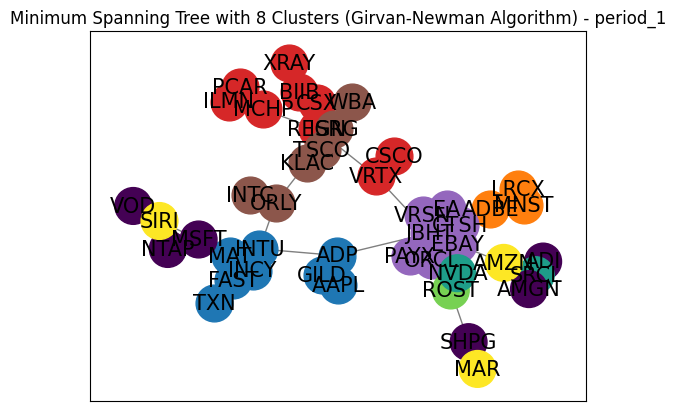

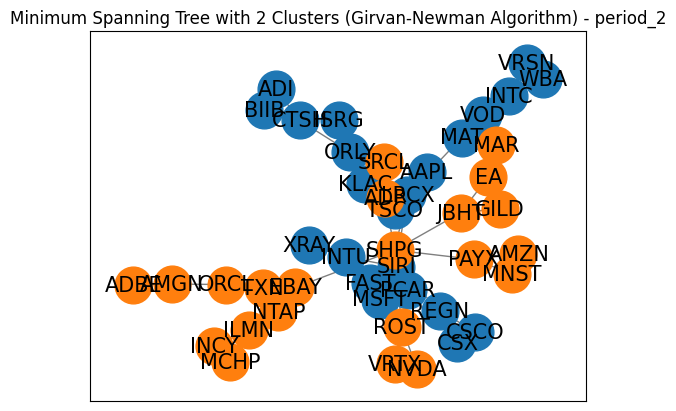

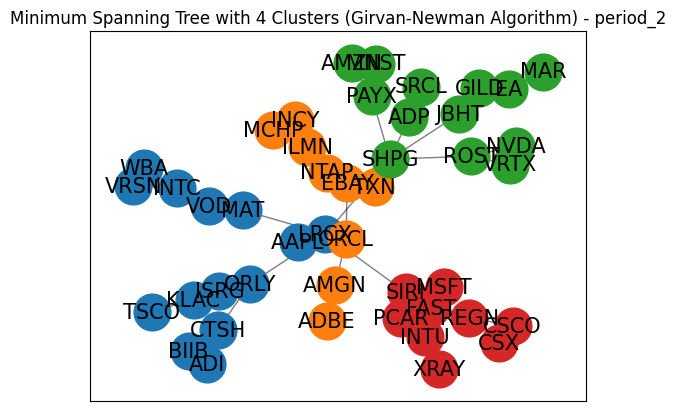

...

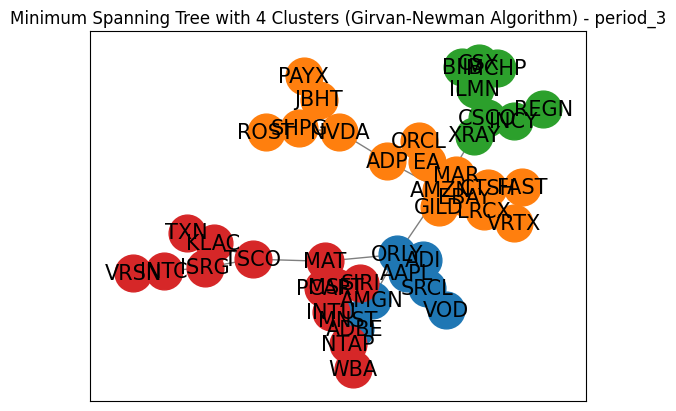

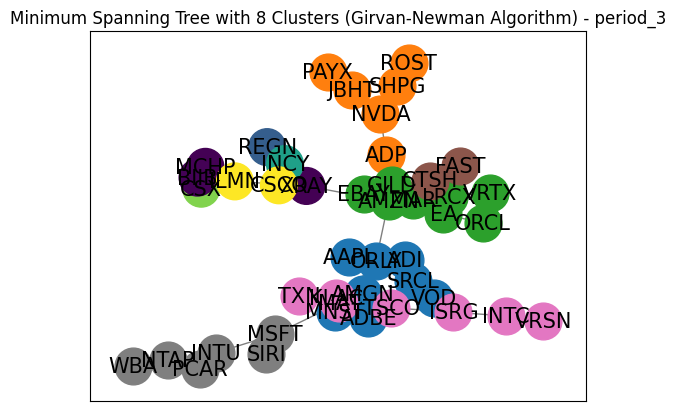

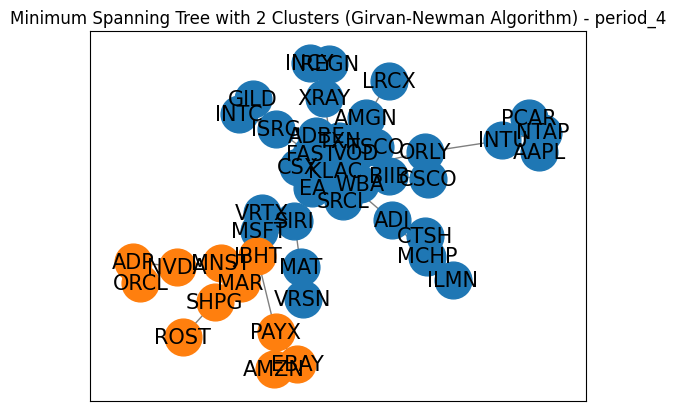

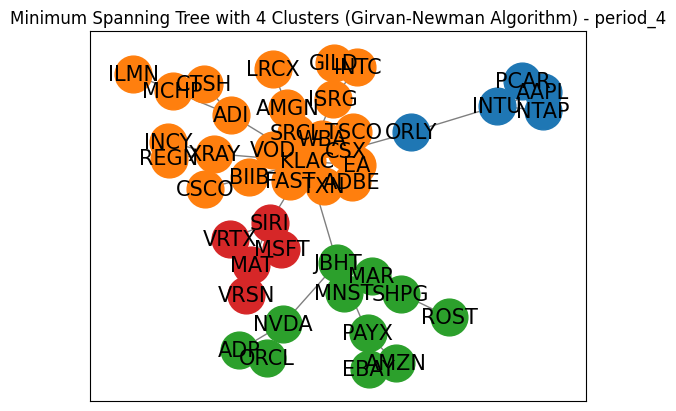

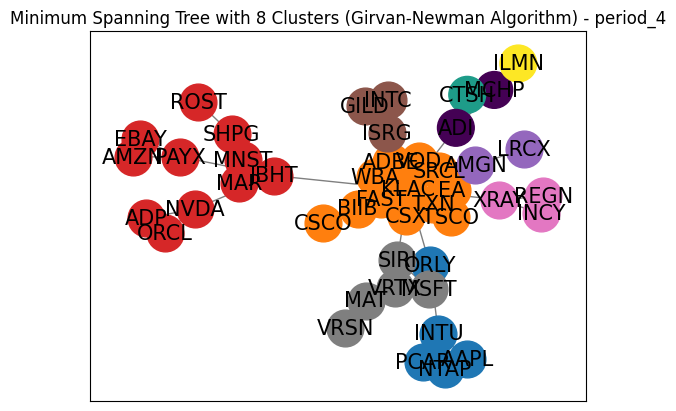

In [58]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period, plot):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        if plot:
            plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(correlation_matrices, plot = True):
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        distance_matrix = correlation_matrices[period]
        tickers = sorted(set([index[0] for index in distance_matrix]))
        labels = {i: ticker for i, ticker in enumerate(tickers)}

        # Convert the distance matrix to a sparse matrix
        sparse_matrix = csr_matrix(distance_matrix)

        # Compute the minimum spanning tree
        mst = minimum_spanning_tree(sparse_matrix)

        # Create a NetworkX graph from the MST
        G = nx.Graph(mst.toarray().astype(float))
        if plot:
            # Draw the graph
            pos = nx.spring_layout(G)  # positions for all nodes
            nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
            nx.draw_networkx_edges(G, pos, edge_color='k')
            nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
            plt.title(f"Minimum Spanning Tree Visualization - {period}")
            plt.show()       
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)

    mst_all_cluster_stocks = {}
    tickers = sorted(set(index[0] for index in distance_matrix))
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period, plot)

    return mst_all_cluster_stocks
mst_all_cluster_stocks = MST(correlation_matrices)

In [59]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period, mst_result_df_clusters = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.691246,0.060899,1.251999,0.269333,"[TSCO, EBAY, MSFT, CTSH, SIRI, PCAR, WBA, EA, ..."
period_1 (4 stocks),0.784259,0.051748,1.625240,0.277893,"[INTU, ADBE, MCHP, INTC, MSFT, EBAY, MCHP, WBA..."
period_1 (8 stocks),0.731594,0.048091,1.591755,0.274796,"[INTU, MNST, AMGN, VRTX, ORCL, ISRG, ROST, MSF..."
period_2 (2 stocks),1.049799,0.038023,2.422351,0.249701,"[ADI, AMZN, FAST, SRCL, CSCO, GILD, CSX, AMGN,..."
period_2 (4 stocks),0.878407,0.031672,2.673498,0.243949,"[CTSH, EBAY, SHPG, CSCO, MAT, EBAY, PAYX, REGN..."
period_2 (8 stocks),1.128341,0.027975,3.988733,0.230353,"[WBA, TXN, CTSH, NVDA, MNST, SIRI, JBHT, ILMN,..."
period_3 (2 stocks),0.243142,0.050422,0.455766,0.399872,"[VRSN, ILMN, KLAC, ADP, ISRG, NVDA, NTAP, JBHT..."
period_3 (4 stocks),0.298269,0.044158,0.661853,0.388883,"[MNST, ROST, MCHP, TSCO, AAPL, JBHT, REGN, MAT..."
period_3 (8 stocks),0.259816,0.041578,0.620394,0.412830,"[AAPL, ROST, EBAY, BIIB, REGN, CTSH, INTC, WBA..."
period_4 (2 stocks),1.024131,0.033369,3.079234,0.394677,"[REGN, ADP, CSX, PAYX, MCHP, ADP, SIRI, AMZN, ..."


## Plots and Diagrams (In Sample)

In [60]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

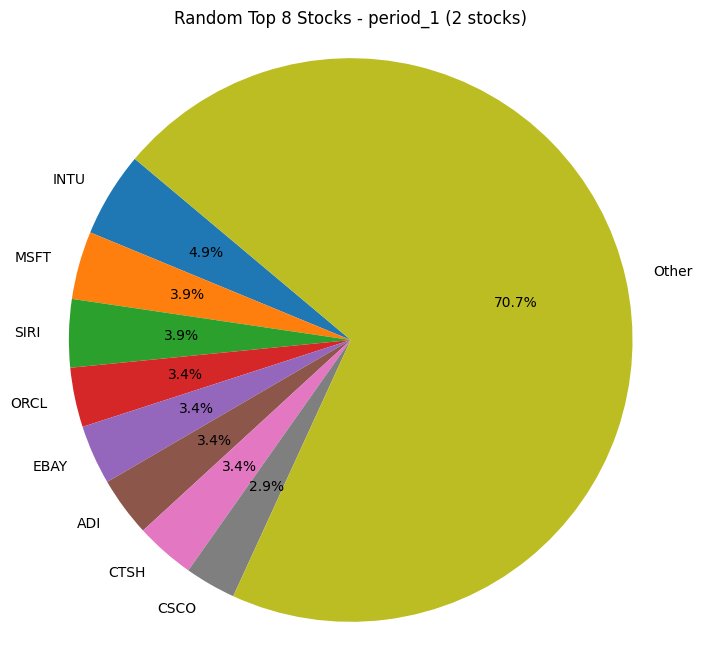

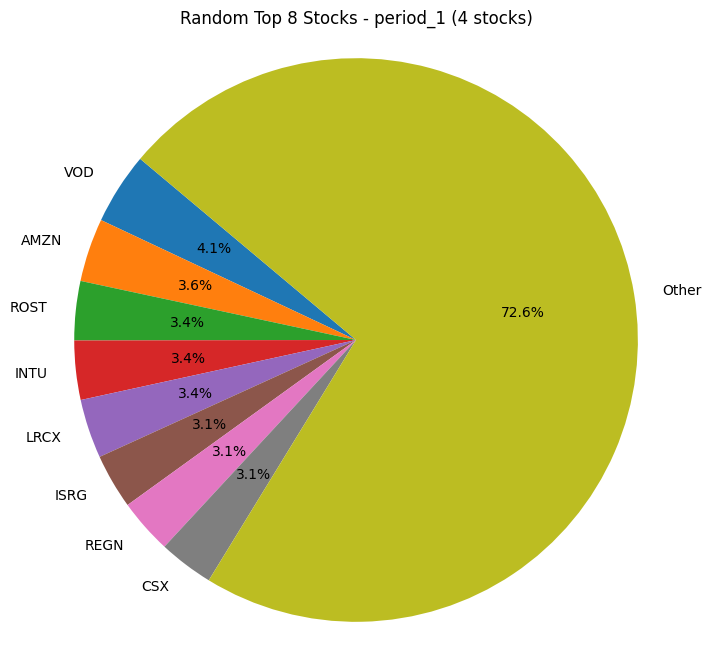

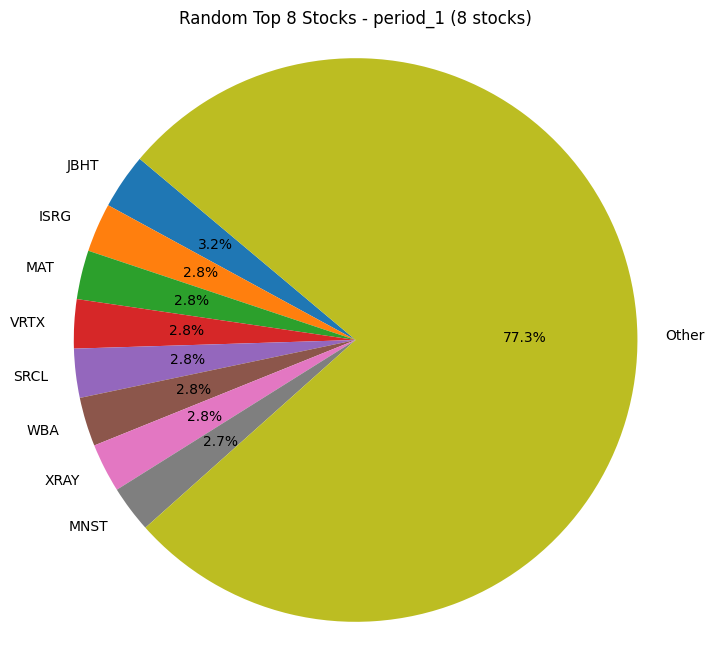

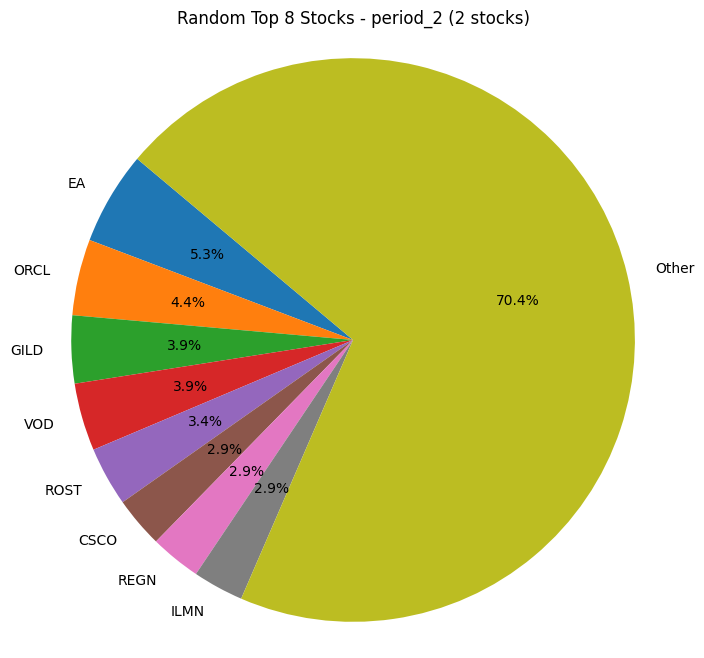

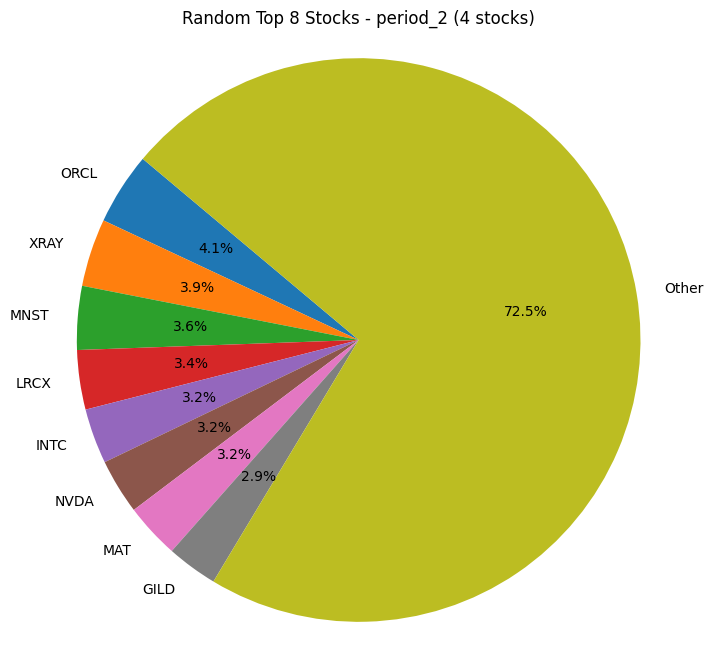

...

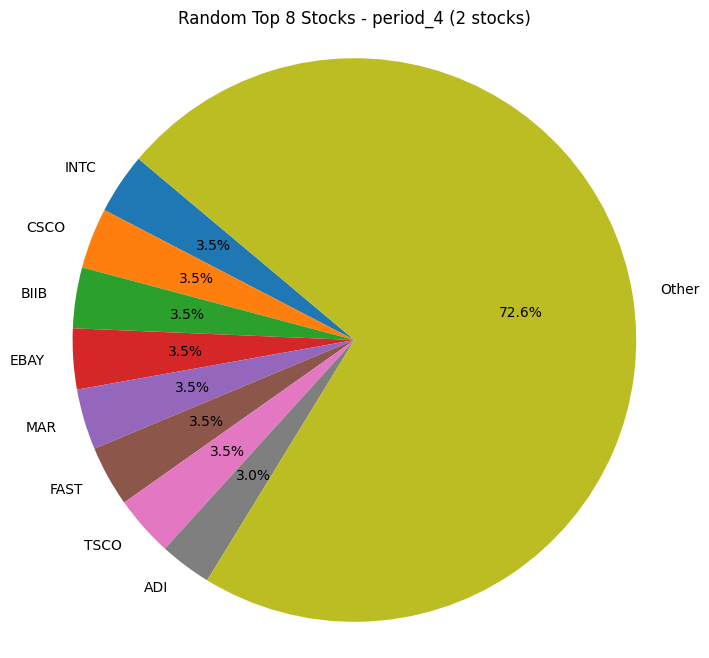

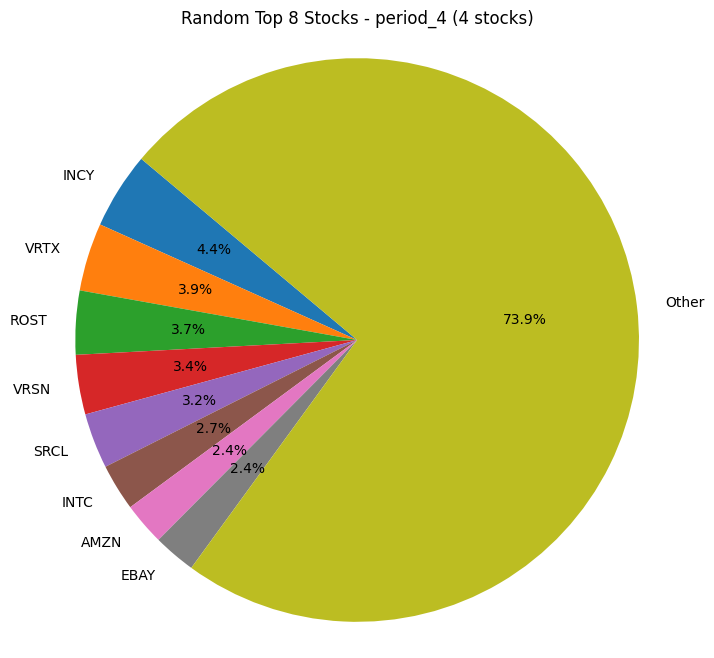

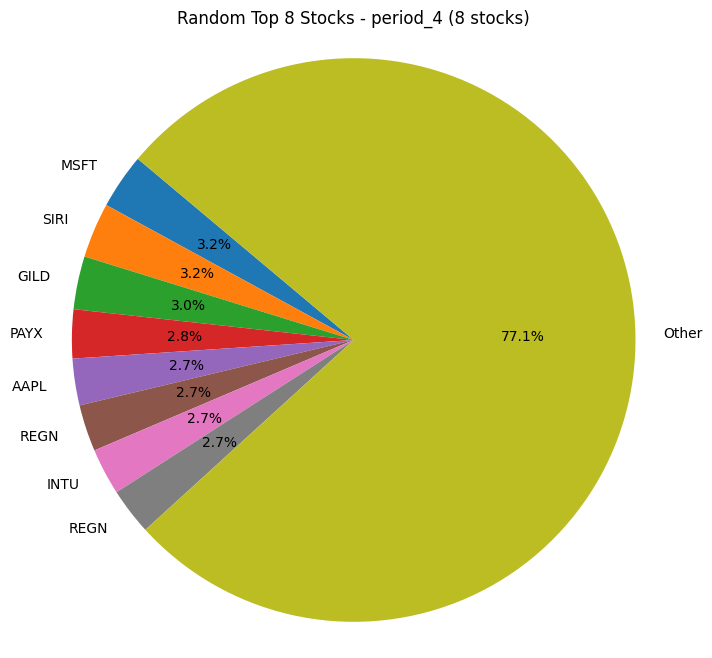

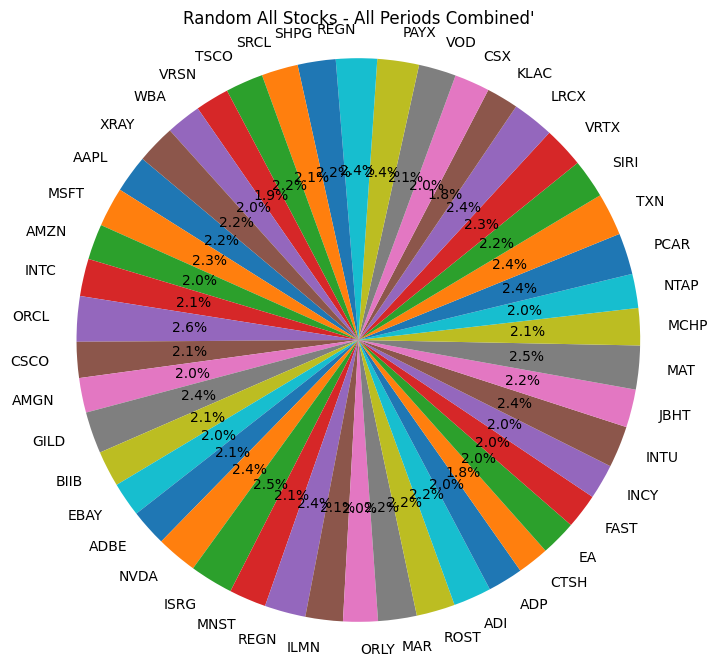

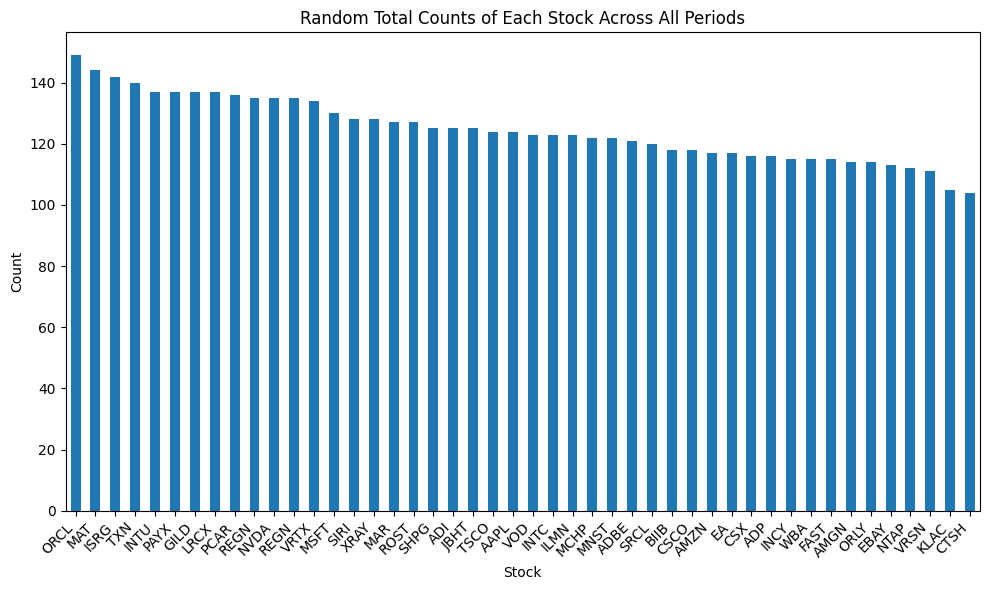

In [61]:
count_of_stocks(result_df_random,custom_tickers, "Random")

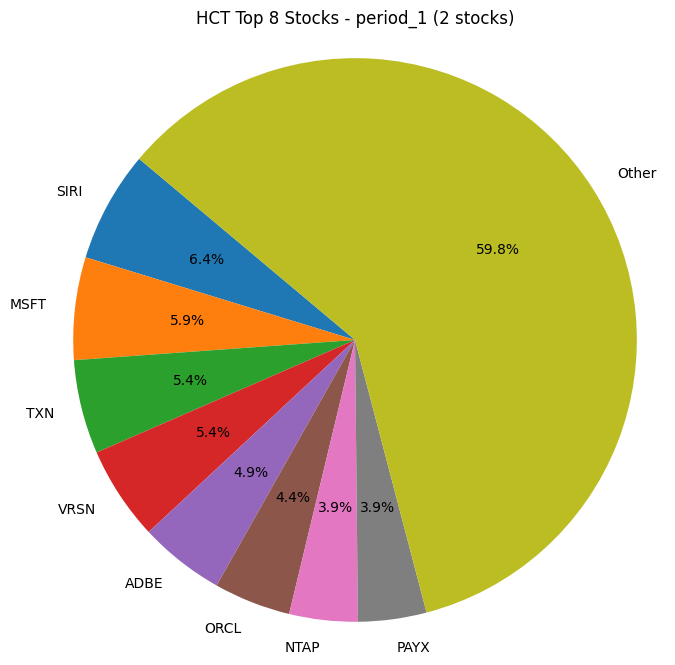

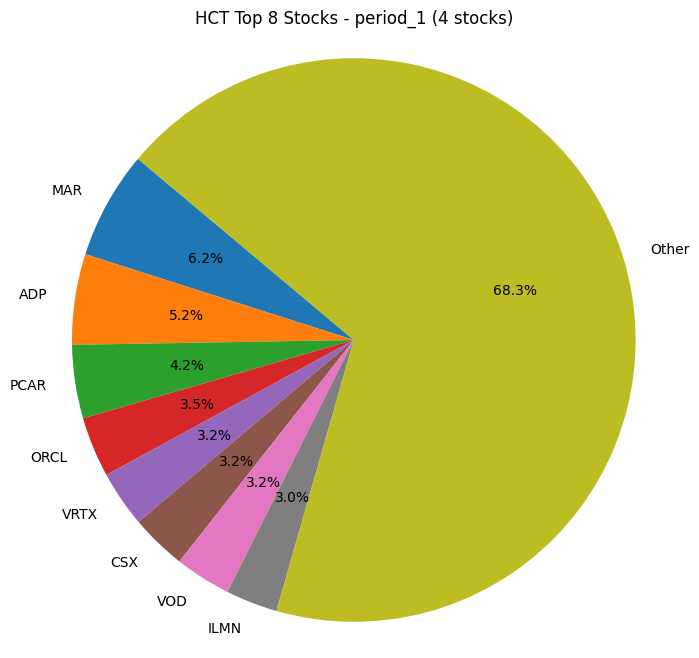

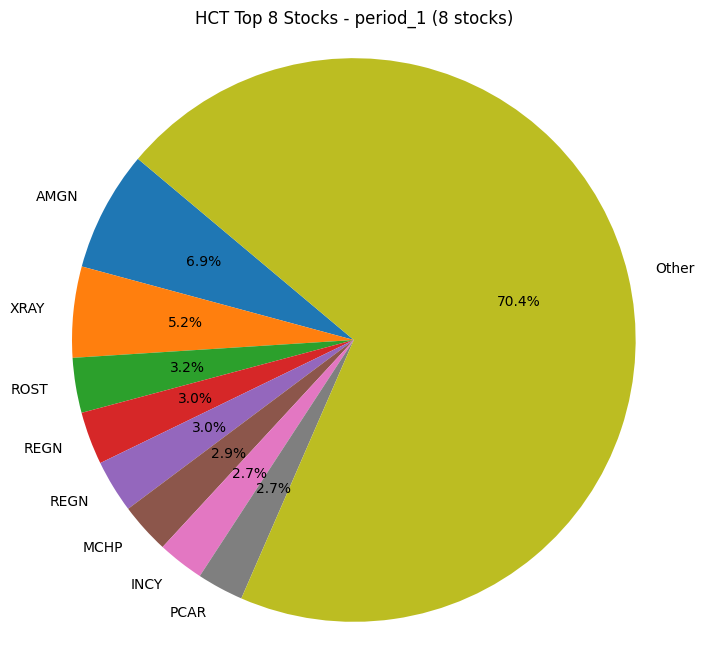

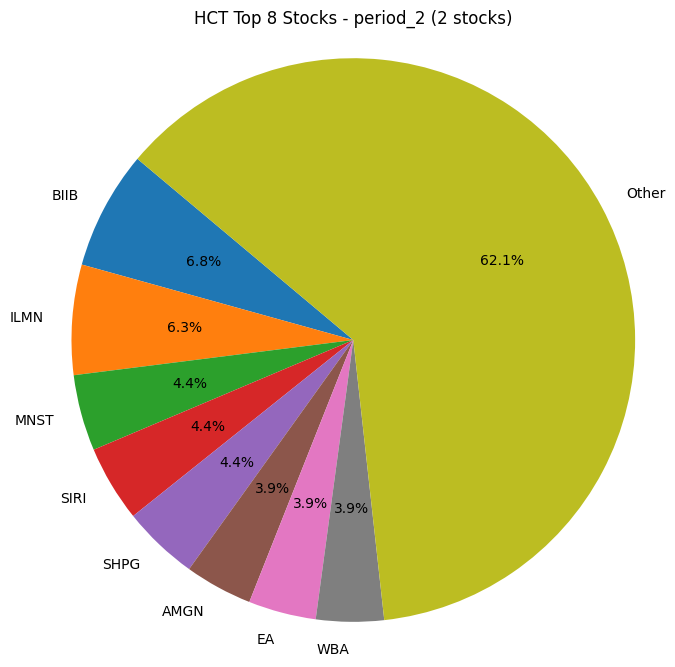

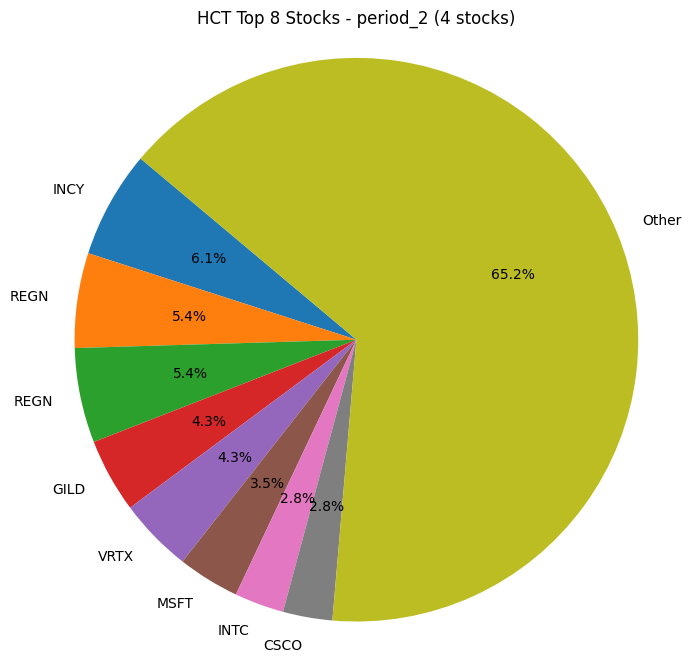

...

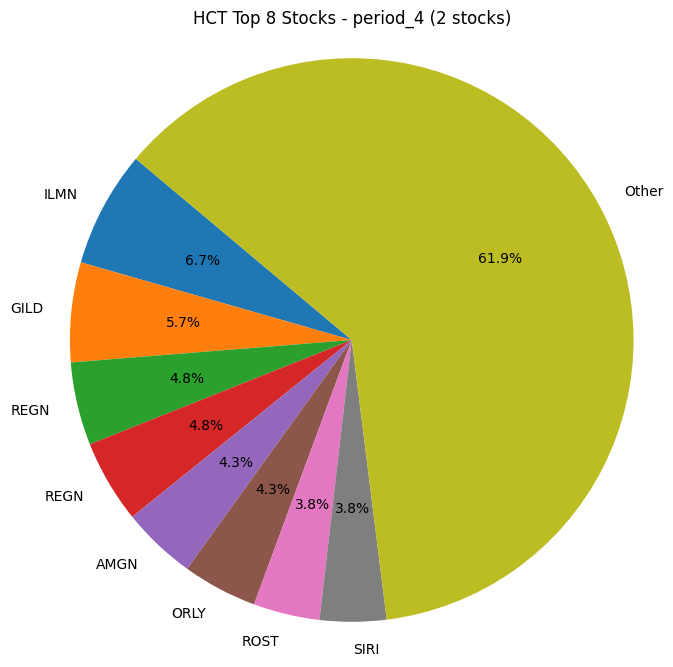

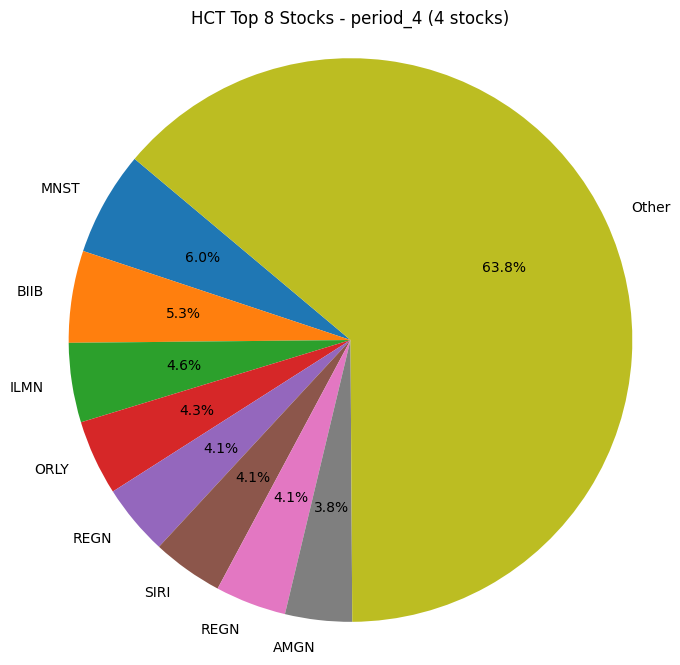

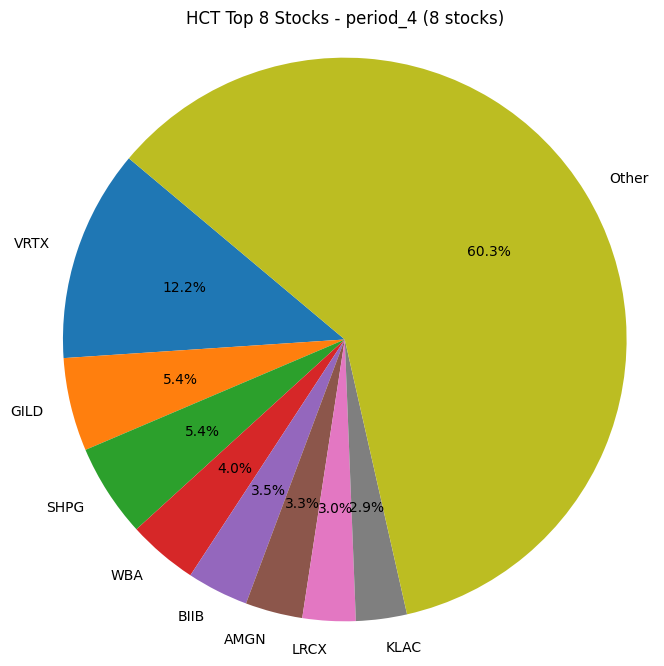

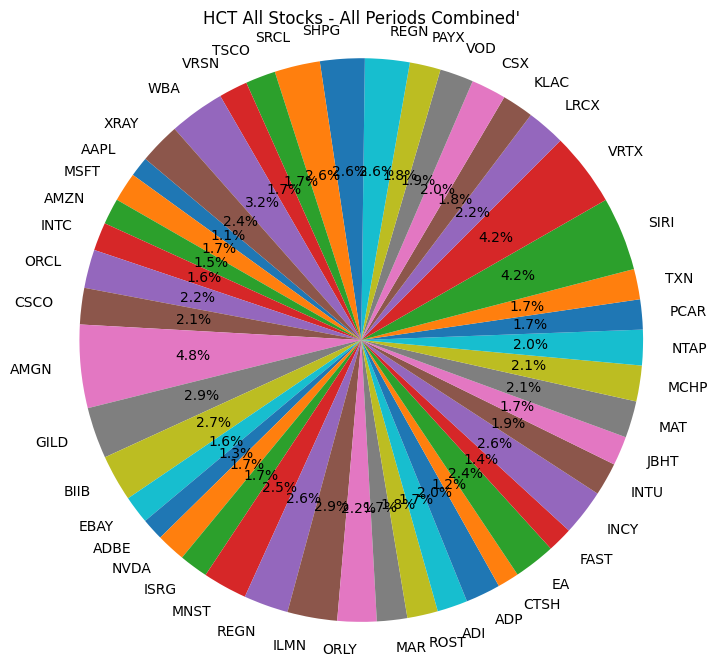

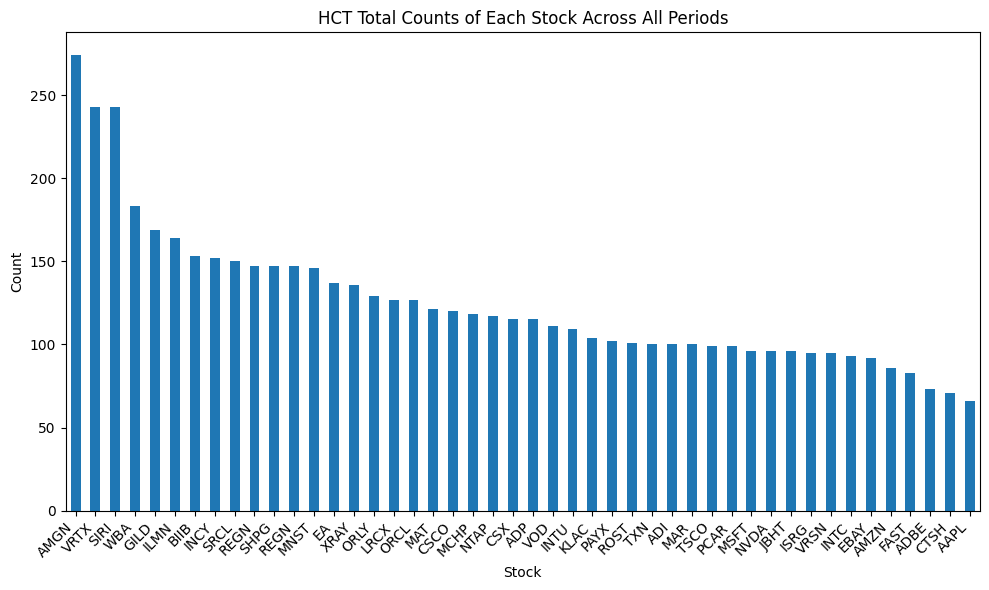

In [62]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

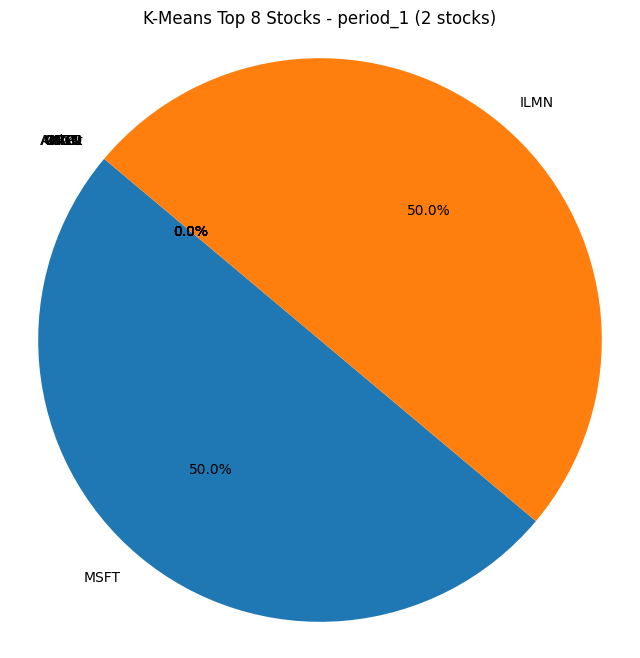

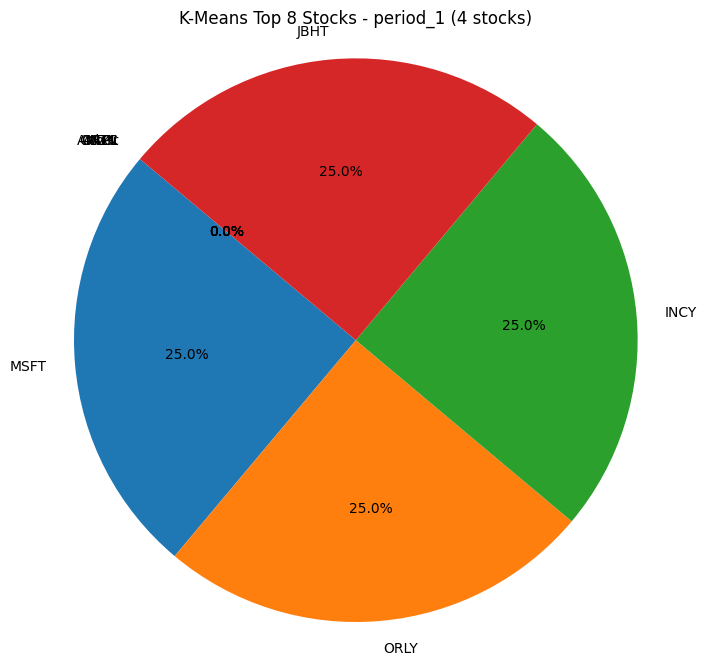

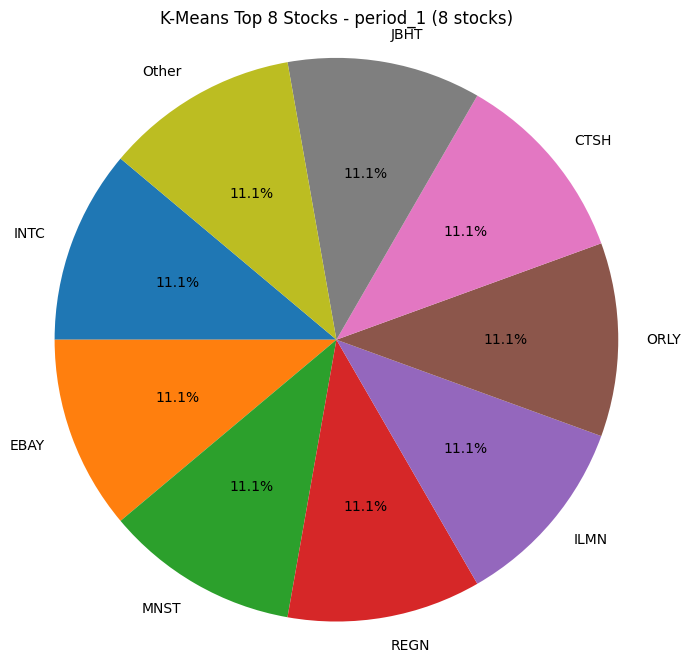

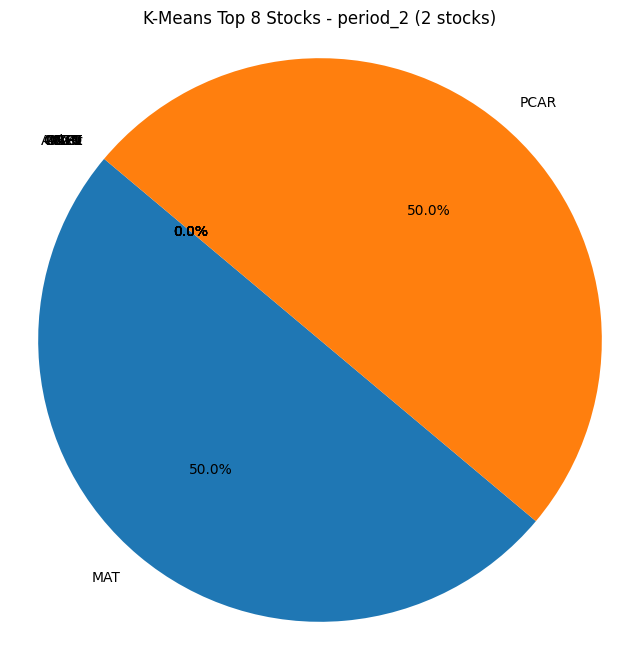

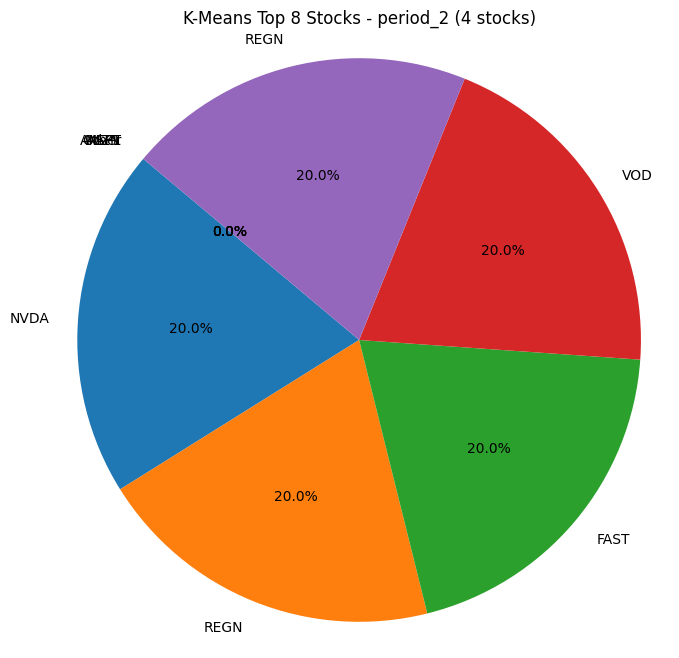

...

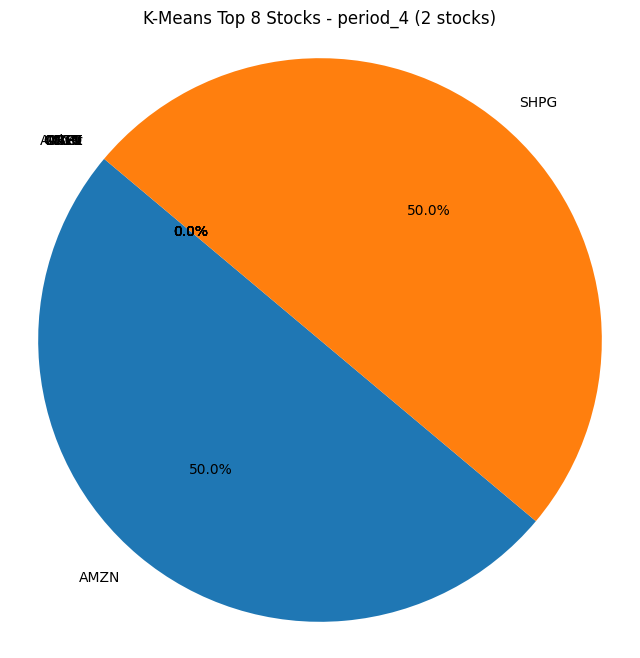

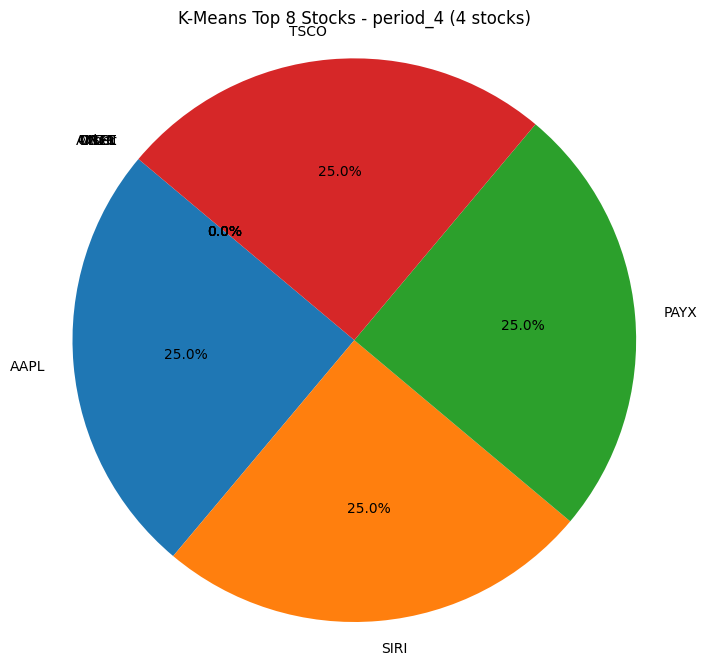

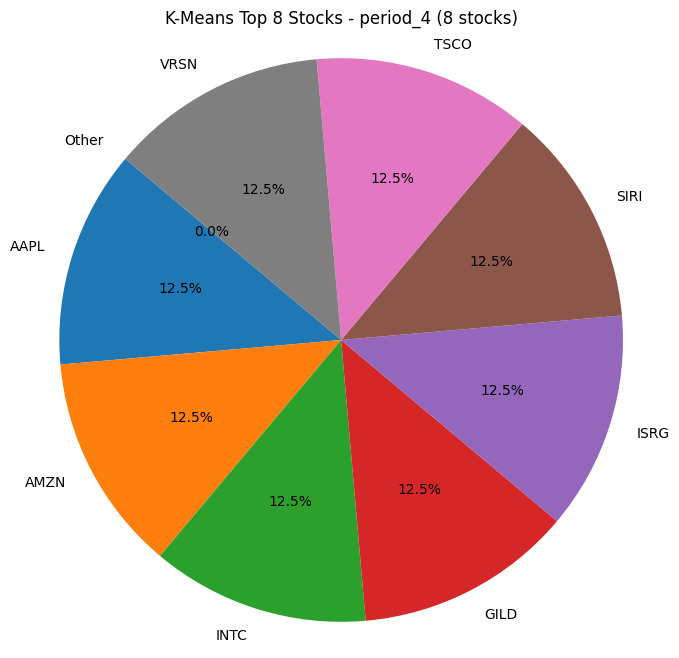

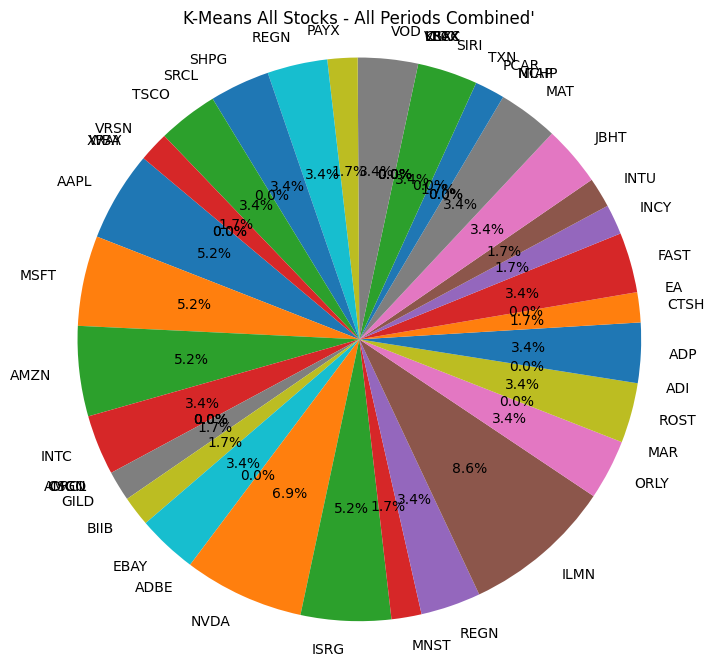

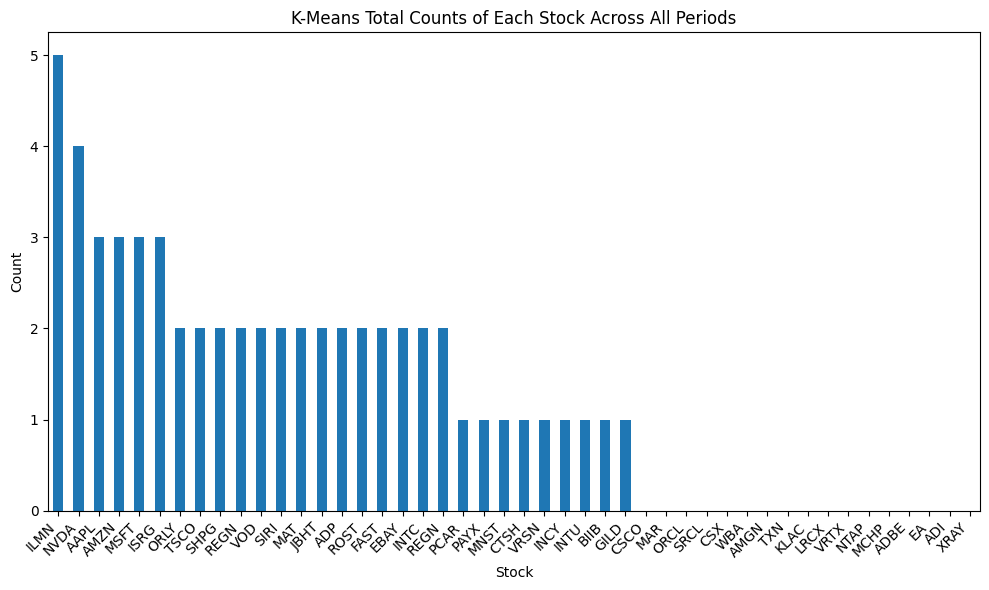

In [63]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

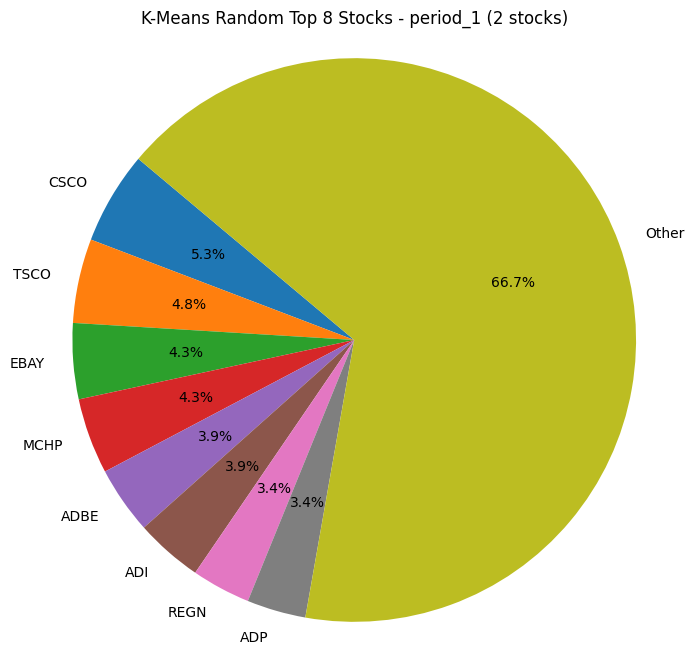

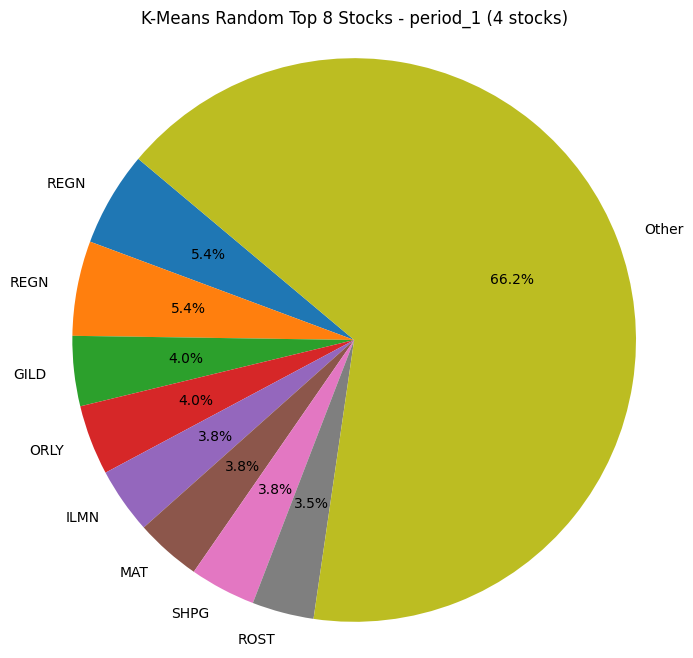

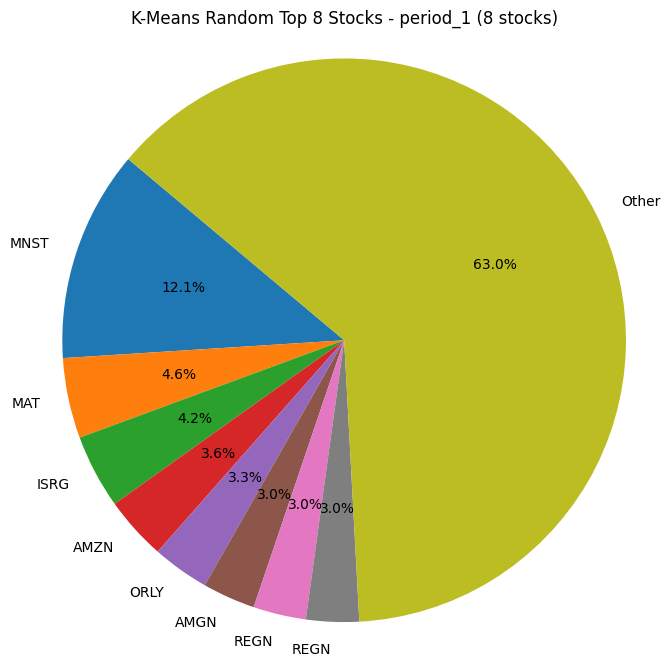

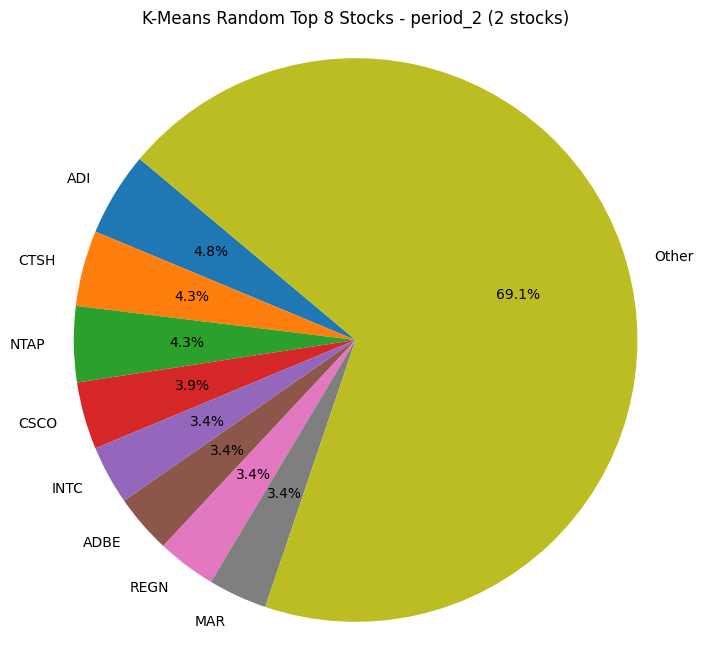

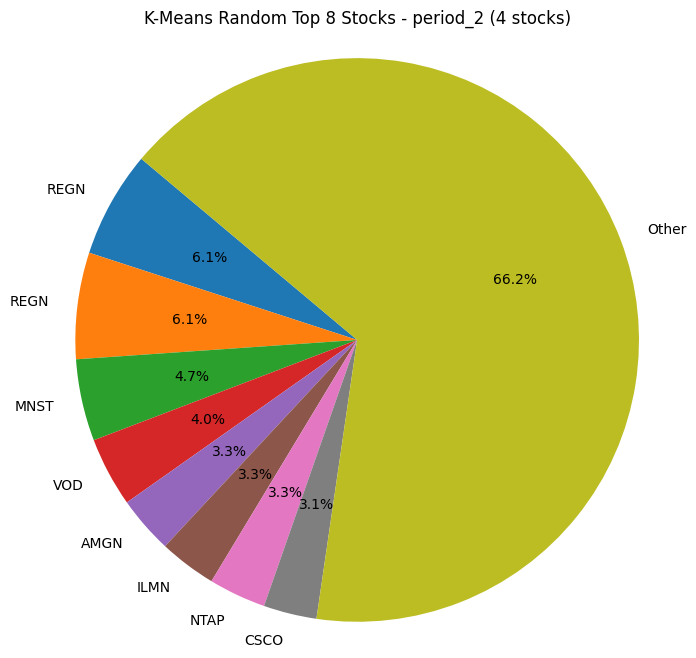

...

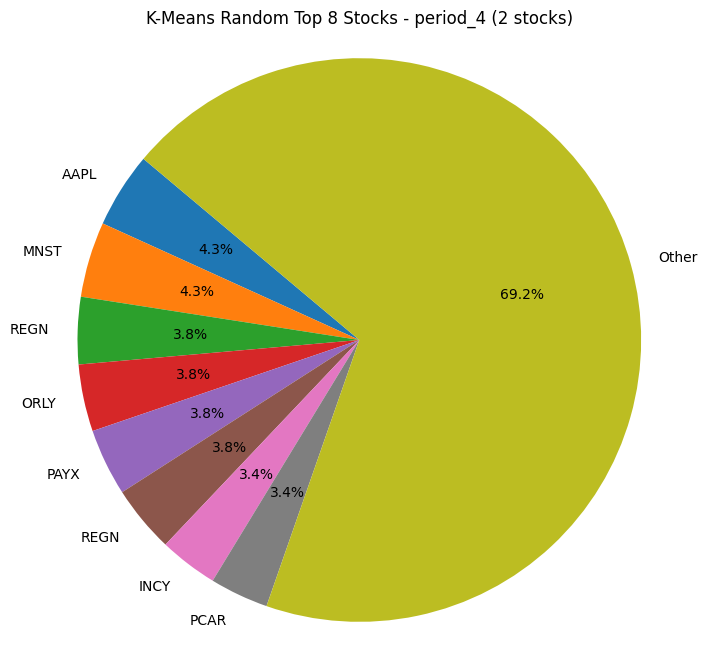

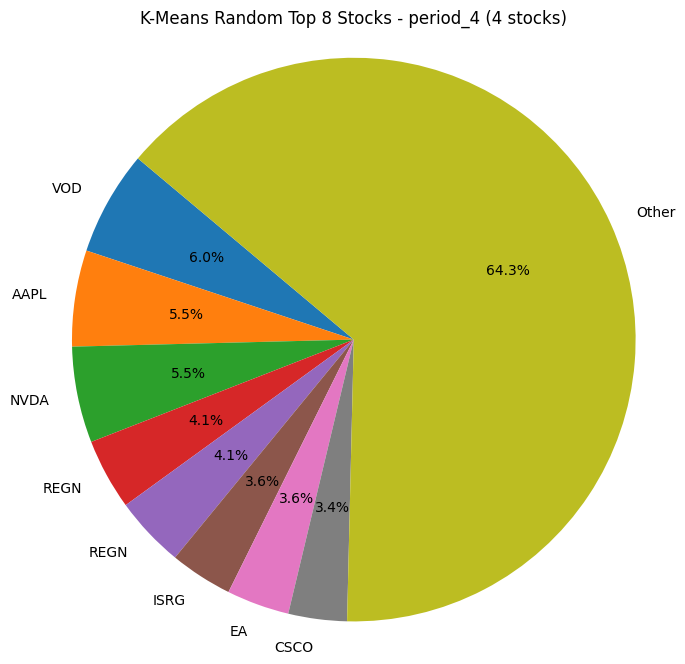

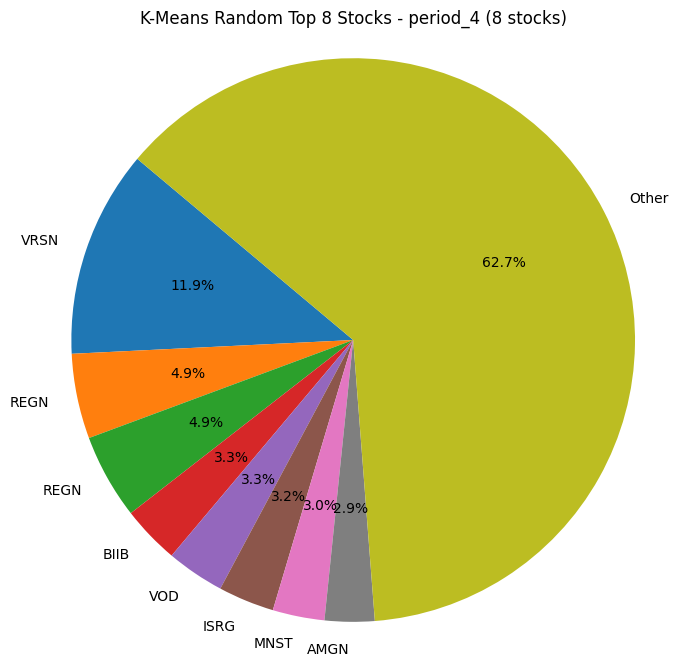

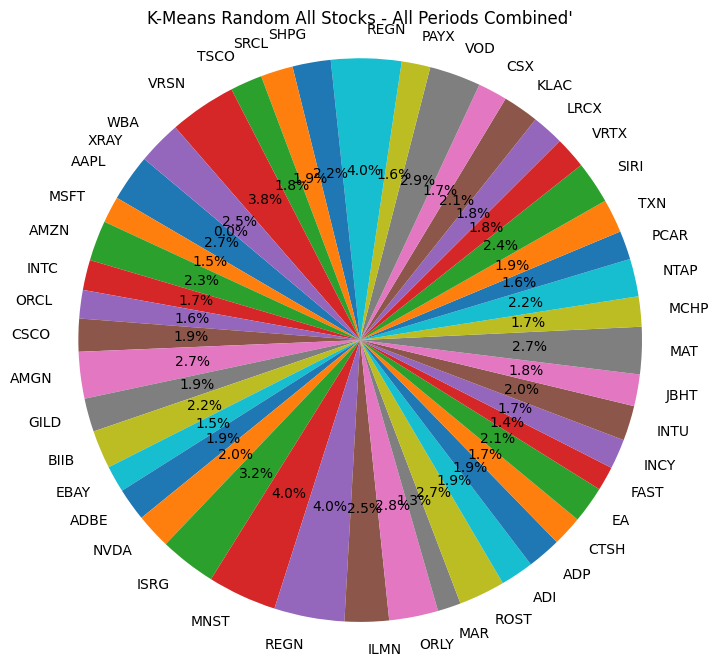

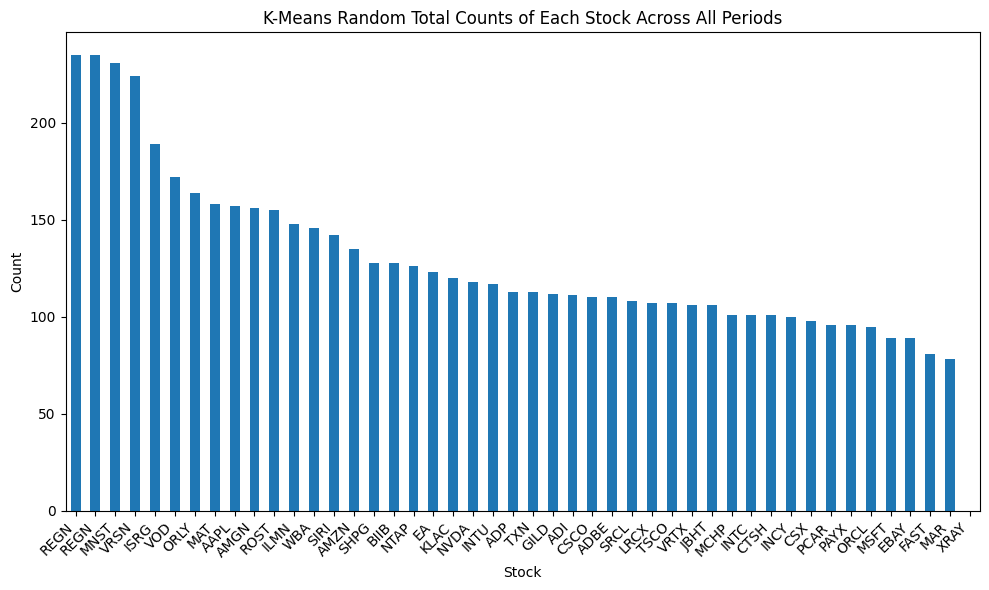

In [64]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

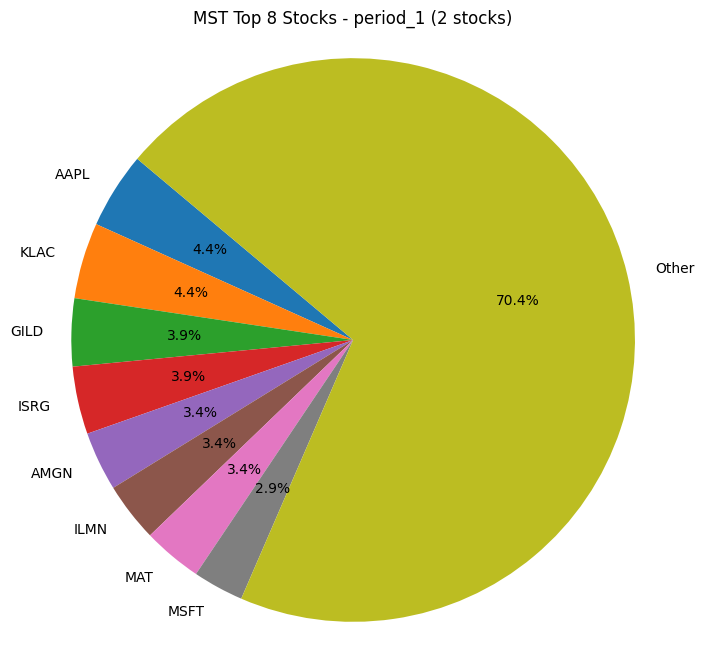

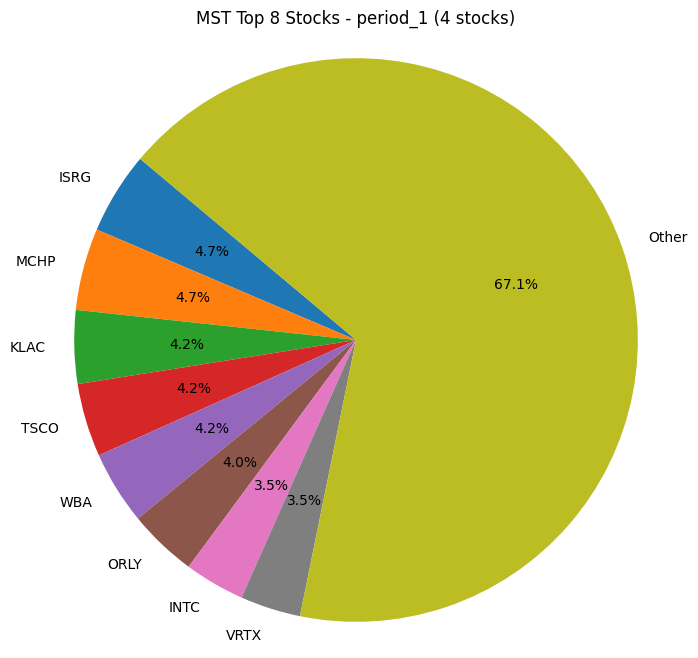

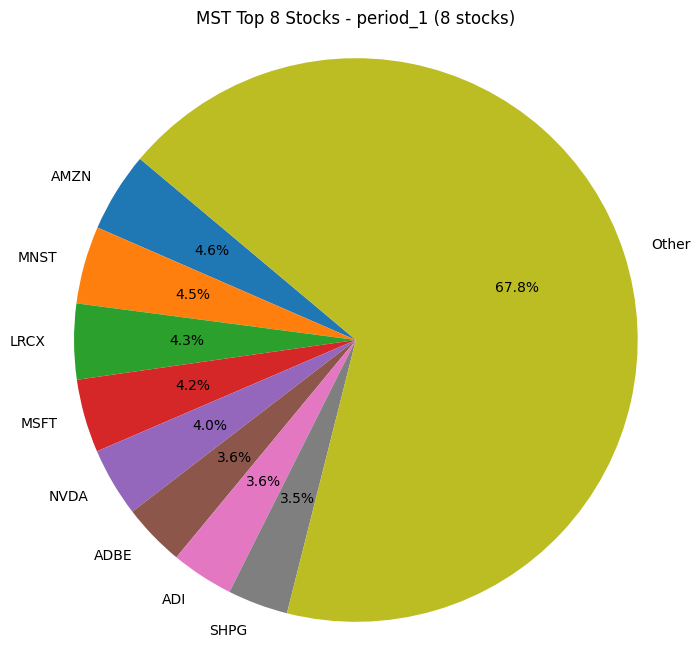

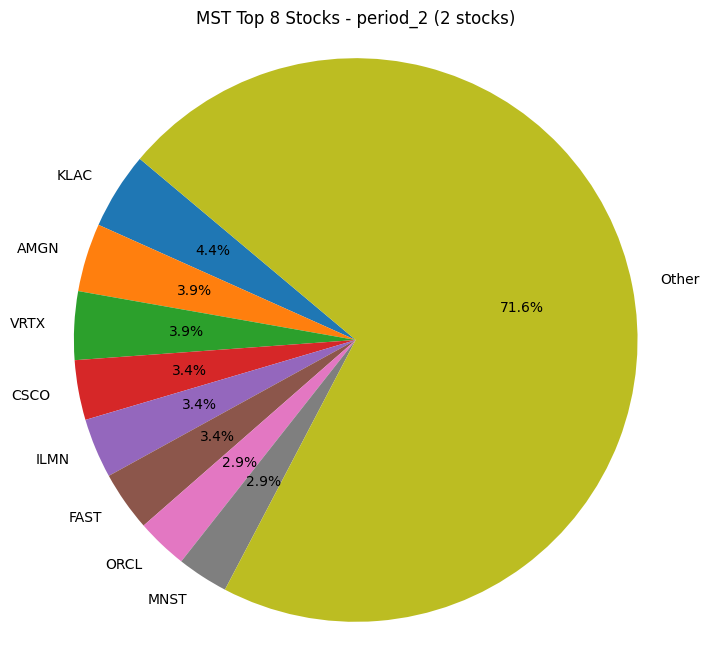

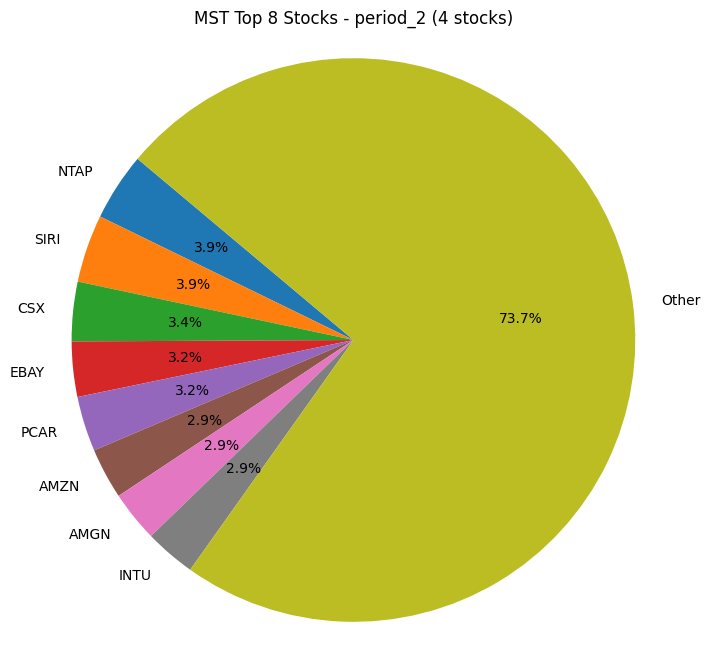

...

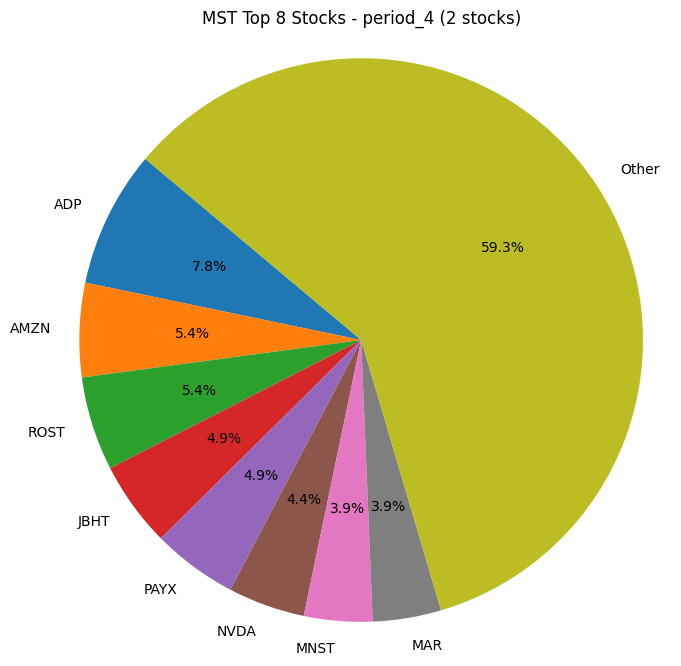

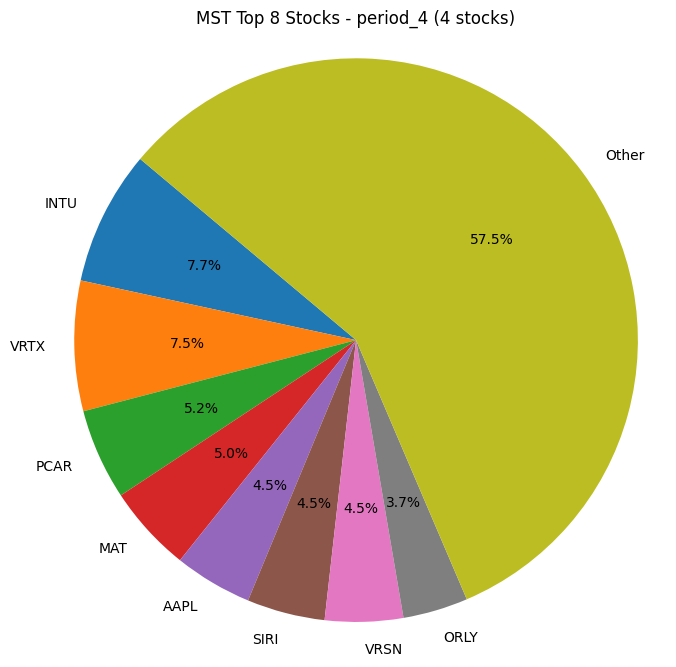

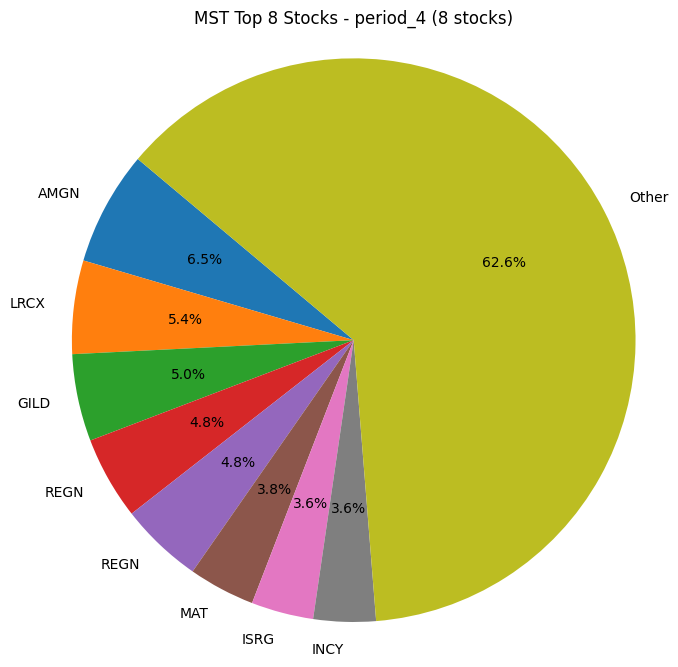

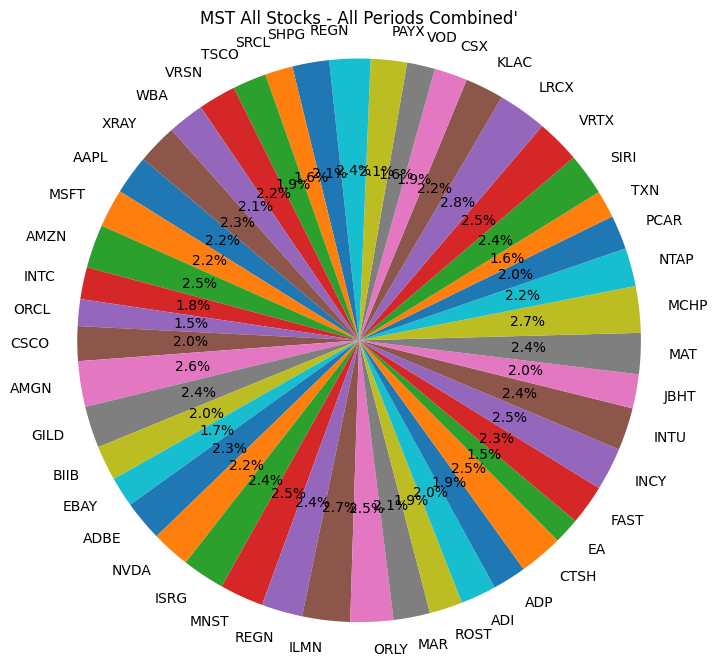

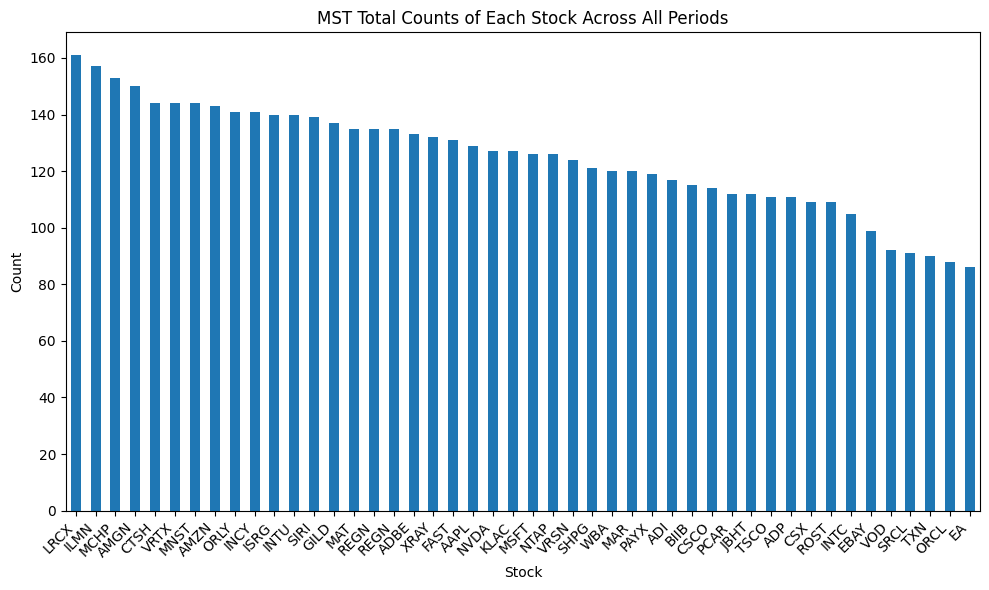

In [65]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [66]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3", "Period 4"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

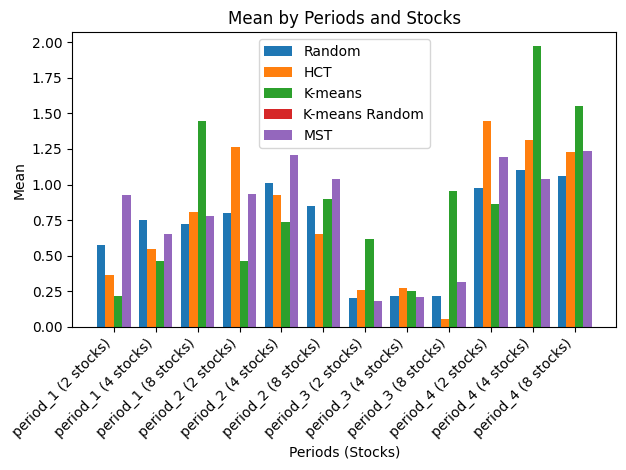

Total Average Mean of Random Values: 0.7076739765831311
Total Average Mean of Cluster Values: 0.7609569252069931
Total Average Mean of K-means Values: 0.8694477826816218
Total Average Mean of K-means Random Values: 0.8096224515316783
Total Average Mean of MST Values: 0.773798027190231

Period 1 Average Mean of Random Values: 0.6834629361279
Period 1 Average Mean of Cluster Values: 0.572461577560572
Period 1 Average Mean of K-means Values: 0.7084369454135683
Period 1 Average Mean of K-means Random Values: 0.7857880768621083
Period 1 Average Mean of MST: 0.7356996432189656
Period 2 Average Mean of Random Values: 0.8869964225662942
Period 2 Average Mean of Cluster Values: 0.9475831355473842
Period 2 Average Mean of K-means Values: 0.7001064140487444
Period 2 Average Mean of K-means Random Values: 1.060669120033827
Period 2 Average Mean of MST: 1.0188488993593923
Period 3 Average Mean of Random Values: 0.21203966108588945
Period 3 Average Mean of Cluster Values: 0.19614532618693173
Period 

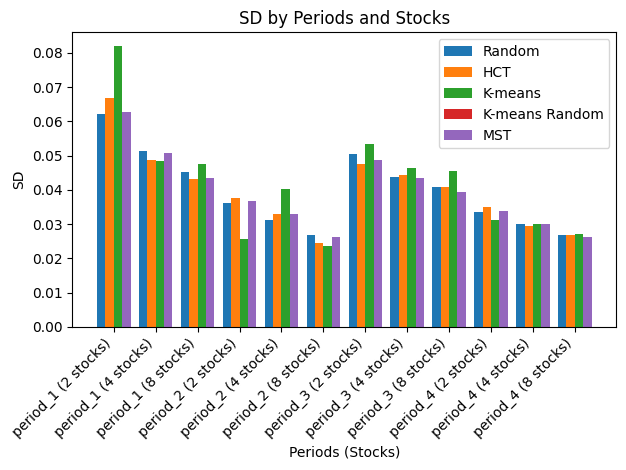

Total Average SD of Random Values: 0.03986289013218917
Total Average SD of Cluster Values: 0.03980347368868696
Total Average SD of K-means Values: 0.04178765605213431
Total Average SD of K-means Random Values: 0.03955078137228165
Total Average SD of MST Values: 0.0404108539267636

Period 1 Average SD of Random Values: 0.052874907997243675
Period 1 Average SD of Cluster Values: 0.05293392200029819
Period 1 Average SD of K-means Values: 0.05932570556804482
Period 1 Average SD of K-means Random Values: 0.05228416801531154
Period 1 Average SD of MST: 0.05357947936139262
Period 2 Average SD of Random Values: 0.03136191064148835
Period 2 Average SD of Cluster Values: 0.03162772602814628
Period 2 Average SD of K-means Values: 0.029960996022135557
Period 2 Average SD of K-means Random Values: 0.03193922318006806
Period 2 Average SD of MST: 0.03255684401011199
Period 3 Average SD of Random Values: 0.04503299509733278
Period 3 Average SD of Cluster Values: 0.044297595092709204
Period 3 Average S

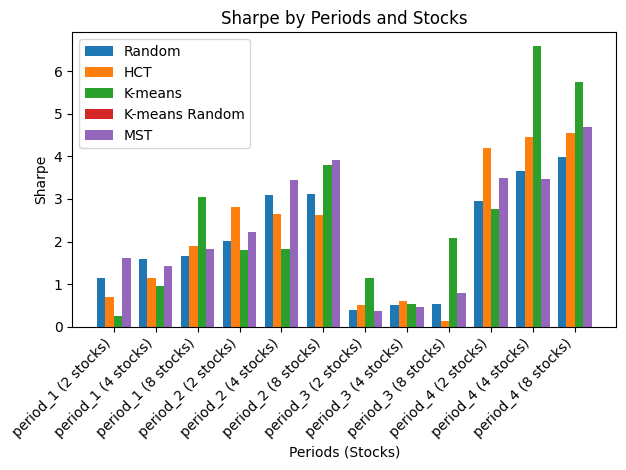

Total Average Sharpe of Random Values: 2.0515605249049824
Total Average Sharpe of Cluster Values: 2.191012114571688
Total Average Sharpe of K-means Values: 2.546356011473645
Total Average Sharpe of K-means Random Values: 2.3107319282071765
Total Average Sharpe of MST Values: 2.184044397057745

Period 1 Average Sharpe of Random Values: 1.4676547953198231
Period 1 Average Sharpe of Cluster Values: 1.248229175472394
Period 1 Average Sharpe of K-means Values: 1.4196563301990184
Period 1 Average Sharpe of K-means Random Values: 1.6185554663084218
Period 1 Average Sharpe of MST: 1.4896645775210697
Period 2 Average Sharpe of Random Values: 2.73285980037987
Period 2 Average Sharpe of Cluster Values: 2.6962601773539236
Period 2 Average Sharpe of K-means Values: 2.4722370530422833
Period 2 Average Sharpe of K-means Random Values: 3.1964412508287947
Period 2 Average Sharpe of MST: 3.0281938819116316
Period 3 Average Sharpe of Random Values: 0.47663769731054056
Period 3 Average Sharpe of Cluster V

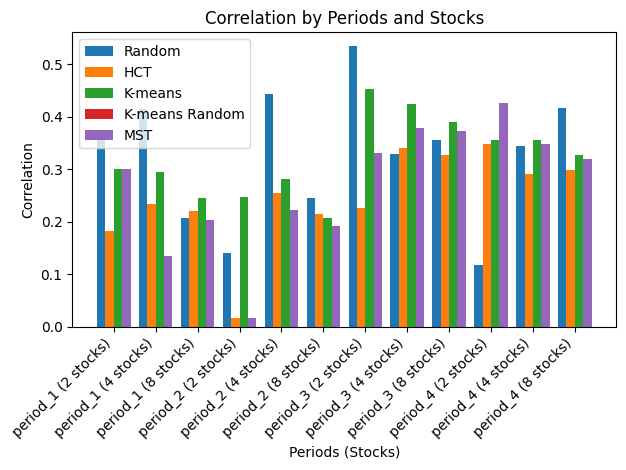

Total Average Correlation of Random Values: 0.32711835250207993
Total Average Correlation of Cluster Values: 0.24602139078149834
Total Average Correlation of K-means Values: 0.3236131741647624
Total Average Correlation of K-means Random Values: 0.27062714023493556
Total Average Correlation of MST Values: 0.3198786142936169

Period 1 Average Correlation of Random Values: 0.33215889685082994
Period 1 Average Correlation of Cluster Values: 0.21170261815503402
Period 1 Average Correlation of K-means Values: 0.28005188772332984
Period 1 Average Correlation of K-means Random Values: 0.21319255582148336
Period 1 Average Correlation of MST: 0.2740073836644042
Period 2 Average Correlation of Random Values: 0.27697628554983983
Period 2 Average Correlation of Cluster Values: 0.16213041179573573
Period 2 Average Correlation of K-means Values: 0.24524567977547074
Period 2 Average Correlation of K-means Random Values: 0.14362746706884524
Period 2 Average Correlation of MST: 0.24133392026325542
Perio

In [67]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

In [68]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

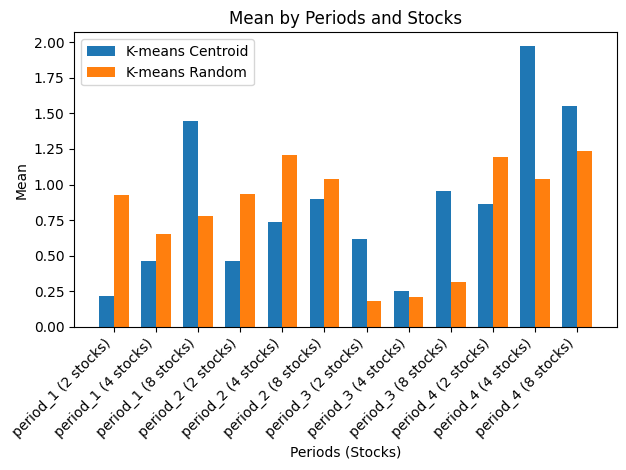

Total Average Mean of K-means Centroid Values: 0.8694477826816218
Total Average Mean of K-means Random Values: 0.8096224515316783

Period 1 Average Mean of K-means Centroid Values: 0.7084369454135683
Period 1 Average Mean of K-means Random Values: 0.7857880768621083
Period 2 Average Mean of K-means Centroid Values: 0.7001064140487444
Period 2 Average Mean of K-means Random Values: 1.060669120033827
Period 3 Average Mean of K-means Centroid Values: 0.6078033947157077
Period 3 Average Mean of K-means Random Values: 0.23446721295798886


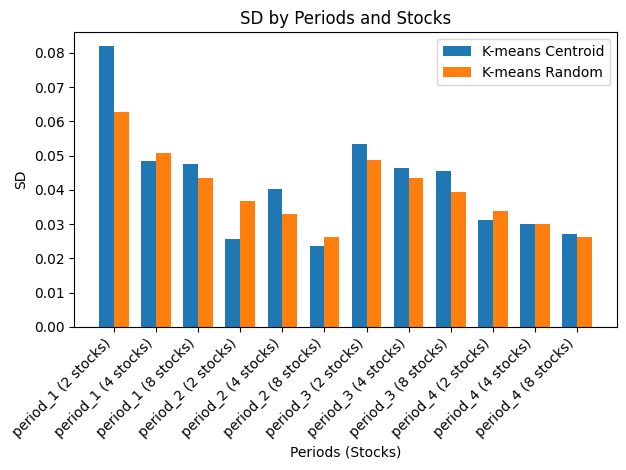

Total Average SD of K-means Centroid Values: 0.04178765605213431
Total Average SD of K-means Random Values: 0.03955078137228165

Period 1 Average SD of K-means Centroid Values: 0.05932570556804482
Period 1 Average SD of K-means Random Values: 0.05228416801531154
Period 2 Average SD of K-means Centroid Values: 0.029960996022135557
Period 2 Average SD of K-means Random Values: 0.03193922318006806
Period 3 Average SD of K-means Centroid Values: 0.048493927062745
Period 3 Average SD of K-means Random Values: 0.04385767001986868


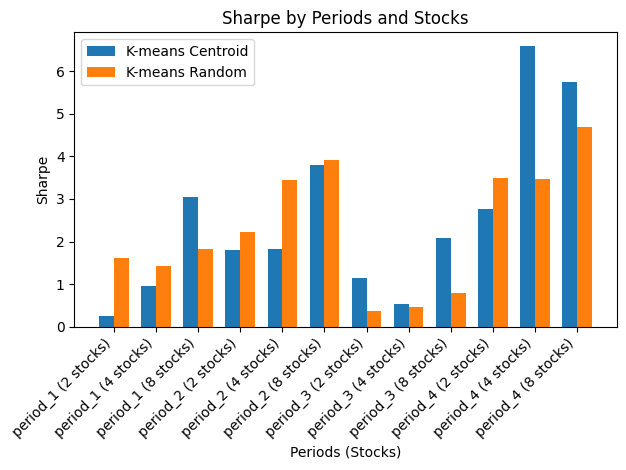

Total Average Sharpe of K-means Centroid Values: 2.546356011473645
Total Average Sharpe of K-means Random Values: 2.3107319282071765

Period 1 Average Sharpe of K-means Centroid Values: 1.4196563301990184
Period 1 Average Sharpe of K-means Random Values: 1.6185554663084218
Period 2 Average Sharpe of K-means Centroid Values: 2.4722370530422833
Period 2 Average Sharpe of K-means Random Values: 3.1964412508287947
Period 3 Average Sharpe of K-means Centroid Values: 1.2637179622808739
Period 3 Average Sharpe of K-means Random Values: 0.5410873106804107


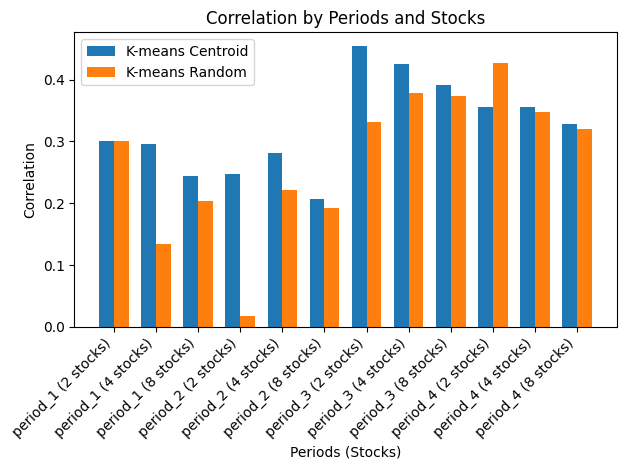

Total Average Correlation of K-means Centroid Values: 0.3236131741647624
Total Average Correlation of K-means Random Values: 0.27062714023493556

Period 1 Average Correlation of K-means Centroid Values: 0.28005188772332984
Period 1 Average Correlation of K-means Random Values: 0.21319255582148336
Period 2 Average Correlation of K-means Centroid Values: 0.24524567977547074
Period 2 Average Correlation of K-means Random Values: 0.14362746706884524
Period 3 Average Correlation of K-means Centroid Values: 0.42289605051118584
Period 3 Average Correlation of K-means Random Values: 0.3607301772592612


In [69]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

### Analyze Performance in the next period

In [70]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [71]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),1.047164,0.036880,2.470262,0.235065,"[VOD, SHPG, AMZN, TSCO, INTC, KLAC, PAYX, EA, ..."
period_2 (4 stocks),0.902192,0.030780,2.767034,0.237460,"[INCY, EBAY, SHPG, PCAR, NVDA, ILMN, MSFT, MNS..."
period_2 (8 stocks),0.834706,0.026956,3.052404,0.238159,"[ADI, CTSH, XRAY, SIRI, AMGN, TXN, ORCL, TSCO,..."
period_3 (2 stocks),0.186346,0.049415,0.363270,0.404809,"[GILD, MNST, TXN, CSCO, NTAP, MAT, TXN, KLAC, ..."
period_3 (4 stocks),0.226558,0.043751,0.516122,0.405021,"[VRSN, EA, ORCL, EBAY, SRCL, ISRG, EA, XRAY, M..."
period_3 (8 stocks),0.241065,0.040517,0.593189,0.407988,"[NTAP, CSCO, PAYX, MAR, VOD, TSCO, MAT, PCAR, ..."
period_4 (2 stocks),1.071237,0.033817,3.177744,0.371981,"[INCY, NTAP, JBHT, INCY, MNST, ADP, EA, INCY, ..."
period_4 (4 stocks),1.012808,0.029384,3.479264,0.370321,"[MAT, SRCL, PAYX, ILMN, INCY, VOD, SRCL, VRTX,..."
period_4 (8 stocks),1.009156,0.026865,3.782146,0.369531,"[ROST, WBA, KLAC, INTC, ADI, SHPG, LRCX, ADP, ..."


In [72]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [73]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.797950,0.036767,1.876853,0.237349,"[TSCO, NVDA, VRTX, LRCX, WBA, ADI, XRAY, CSCO,..."
period_2 (4 stocks),0.878680,0.029532,2.808499,0.233985,"[SIRI, NTAP, ROST, CSX, AMZN, ADBE, ORLY, PCAR..."
period_2 (8 stocks),0.787378,0.025833,2.983714,0.220182,"[AMZN, EBAY, KLAC, XRAY, REGN, ORLY, ROST, CSX..."
period_3 (2 stocks),0.173981,0.049611,0.358528,0.355246,"[MAT, ORLY, EA, AMZN, MNST, XRAY, SRCL, MSFT, ..."
period_3 (4 stocks),0.257456,0.044599,0.573942,0.382037,"[MNST, REGN, PAYX, KLAC, SRCL, INCY, VRSN, NTA..."
period_3 (8 stocks),0.185805,0.039200,0.468677,0.381417,"[SHPG, MSFT, ROST, MCHP, INTU, ORLY, EA, WBA, ..."
period_4 (2 stocks),1.161060,0.033781,3.394422,0.325515,"[TSCO, BIIB, ADI, VOD, ROST, AMGN, PCAR, MSFT,..."
period_4 (4 stocks),1.200068,0.029328,4.100176,0.318630,"[NTAP, MSFT, CSCO, SRCL, WBA, GILD, ADBE, VRTX..."
period_4 (8 stocks),1.354334,0.025808,5.249081,0.304706,"[EA, AMZN, INTC, CSCO, AMGN, SRCL, MAT, SIRI, ..."


In [74]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.932581,0.038211,2.108107,0.246764,"[AMGN, NVDA, VOD, ADI, VOD, ADI, EA, AAPL, MNS..."
period_2 (4 stocks),1.052884,0.032014,3.111547,0.209091,"[VOD, AMZN, JBHT, SHPG, VRTX, LRCX, ILMN, MNST..."
period_2 (8 stocks),1.688596,0.029307,5.745648,0.207631,"[ORLY, TSCO, FAST, SHPG, ADI, MNST, ILMN, AMZN..."
period_3 (2 stocks),0.164117,0.050055,0.316267,0.409438,"[CTSH, SHPG, MAR, MNST, NVDA, PAYX, TXN, ROST,..."
period_3 (4 stocks),0.248174,0.043853,0.558201,0.376815,"[MAT, EBAY, ORCL, ILMN, VOD, AMZN, KLAC, AMGN,..."
period_3 (8 stocks),0.328207,0.041021,0.793649,0.387570,"[CSCO, GILD, CSX, MNST, MAT, PAYX, VOD, WBA, O..."
period_4 (2 stocks),1.163392,0.034251,3.387685,0.325870,"[EBAY, SRCL, ORCL, SRCL, MAT, EA, ADBE, SIRI, ..."
period_4 (4 stocks),0.976002,0.029476,3.313580,0.373172,"[JBHT, ILMN, LRCX, ORLY, MAR, REGN, TXN, ORLY,..."
period_4 (8 stocks),1.373931,0.025963,5.282038,0.321715,"[ORLY, ADBE, ISRG, CSX, MAT, ADI, SIRI, TSCO, ..."


In [75]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [76]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),1.563977,0.045420,3.443404,0.272366,"[ILMN, MSFT]"
period_2 (4 stocks),0.323731,0.030135,1.074267,0.231754,"[INCY, MSFT, JBHT, ORLY]"
period_2 (8 stocks),1.903104,0.033253,5.723179,0.238768,"[ORLY, EBAY, JBHT, REGN, INTC, MNST, ILMN, CTSH]"
period_3 (2 stocks),-0.084194,0.054652,-0.154054,0.580690,"[PCAR, MAT]"
period_3 (4 stocks),0.205786,0.053087,0.387641,0.416424,"[VOD, FAST, NVDA, REGN]"
period_3 (8 stocks),0.281737,0.040993,0.687276,0.426620,"[NVDA, MSFT, FAST, SHPG, MAT, ADP, VOD, ISRG]"
period_4 (2 stocks),1.750491,0.037098,4.718523,0.127884,"[ROST, ILMN]"
period_4 (4 stocks),0.700281,0.031588,2.216927,0.338075,"[ADP, ILMN, NVDA, INTU]"
period_4 (8 stocks),1.315632,0.029486,4.461935,0.334937,"[AMZN, AAPL, ISRG, EBAY, ROST, NVDA, BIIB, ILMN]"


In [77]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters_out_sample(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        period_number = int(period[-1])
        if period_number == 4: #last period
            break
        else:
            next_period = 'period_'+str(period_number+1)
        
        next_returns_data = period_dfs[next_period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = next_returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = next_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[next_period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period_out_sample, mst_result_df_clusters_out_sample = calculate_metrics_for_mst_clusters_out_sample(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters_out_sample


,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.879854,0.036616,2.173406,0.215745,"[ADP, XRAY, INCY, MNST, INTU, SRCL, INTU, EA, ..."
period_2 (4 stocks),0.994655,0.031278,2.904791,0.237983,"[GILD, PAYX, MCHP, WBA, SIRI, CTSH, CSCO, ORLY..."
period_2 (8 stocks),0.815750,0.027484,2.959498,0.237814,"[GILD, LRCX, ADI, REGN, CTSH, WBA, NVDA, NTAP,..."
period_3 (2 stocks),0.265740,0.049523,0.508520,0.397358,"[REGN, ILMN, VOD, ADP, FAST, AMZN, BIIB, EA, M..."
period_3 (4 stocks),0.220754,0.044950,0.479798,0.402952,"[ISRG, ORCL, GILD, SIRI, MAT, ORCL, ADP, SIRI,..."
period_3 (8 stocks),0.267457,0.041249,0.647891,0.397218,"[VOD, EBAY, TSCO, SHPG, PAYX, PCAR, MAR, INCY,..."
period_4 (2 stocks),0.968623,0.034412,2.859704,0.384486,"[MAT, CSCO, INTU, ILMN, AAPL, AMZN, MNST, ADP,..."
period_4 (4 stocks),1.038928,0.029483,3.550415,0.370709,"[AAPL, ADP, INCY, TSCO, ADI, EBAY, ILMN, TSCO,..."
period_4 (8 stocks),1.017894,0.027268,3.738165,0.384953,"[ORLY, SHPG, LRCX, CSX, INCY, FAST, MAT, PCAR,..."


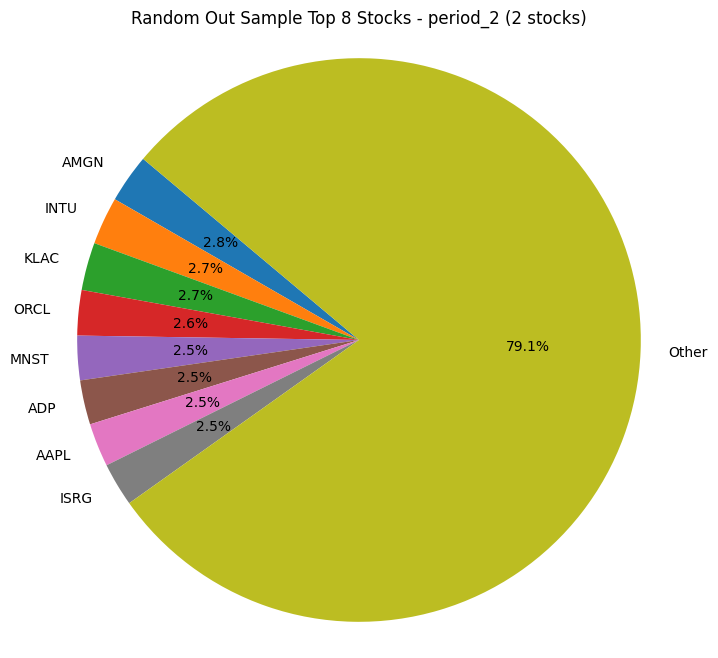

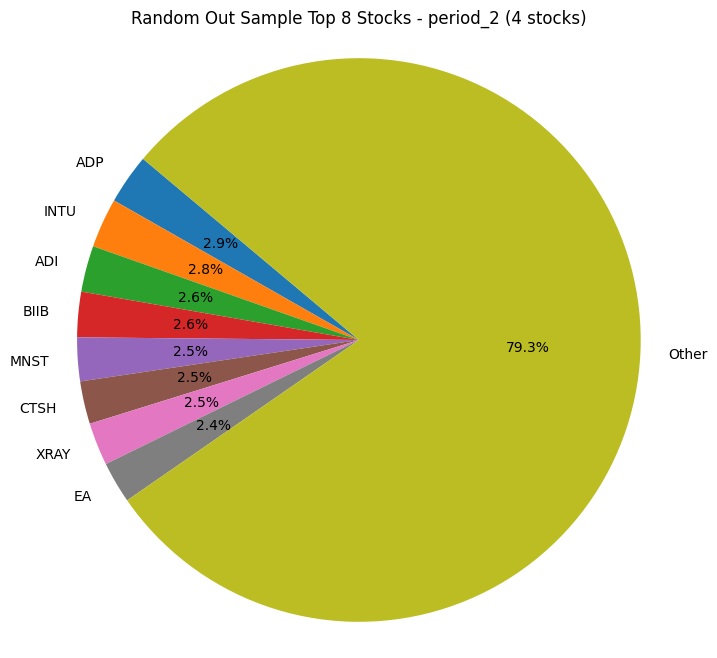

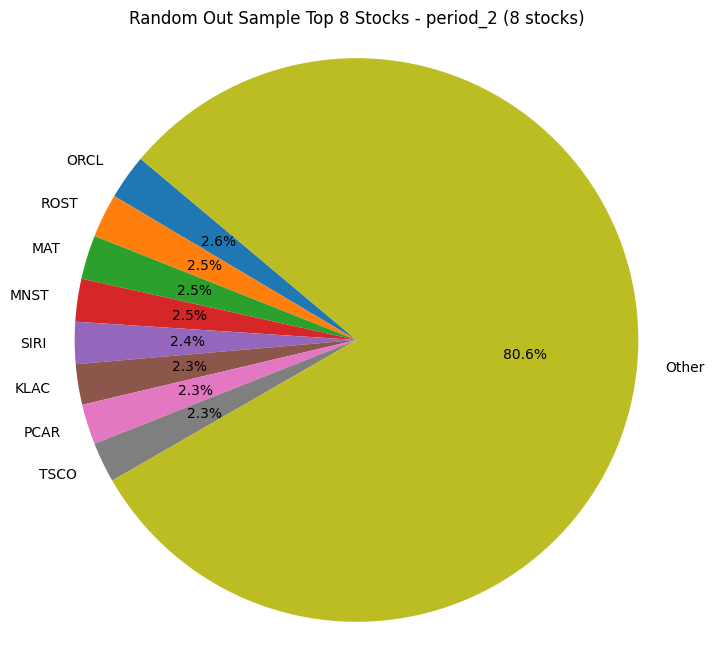

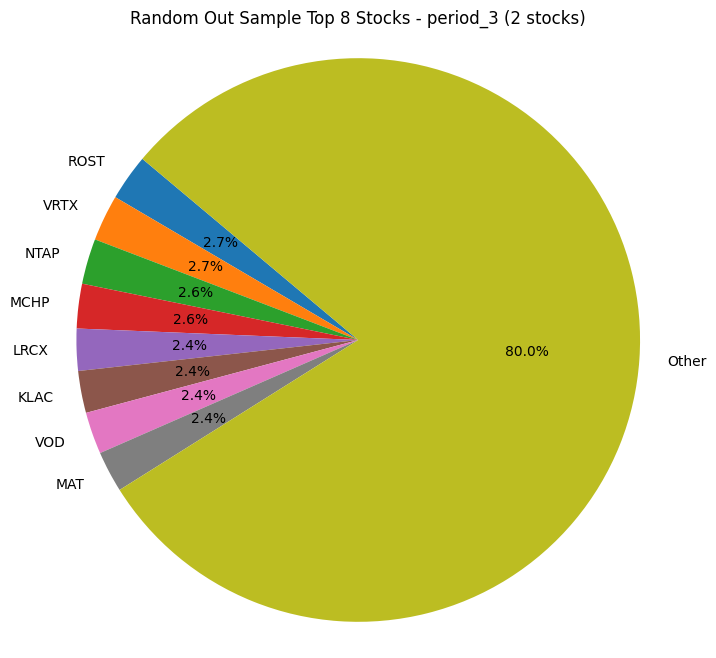

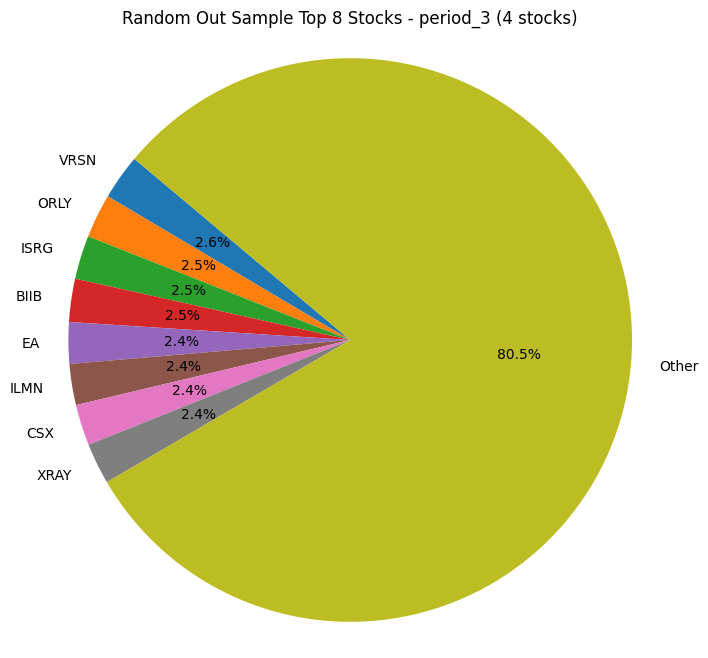

...

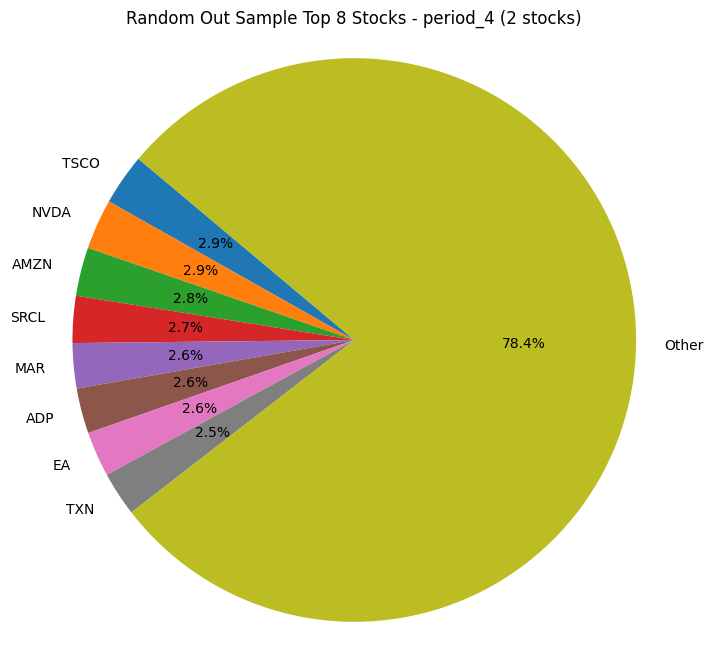

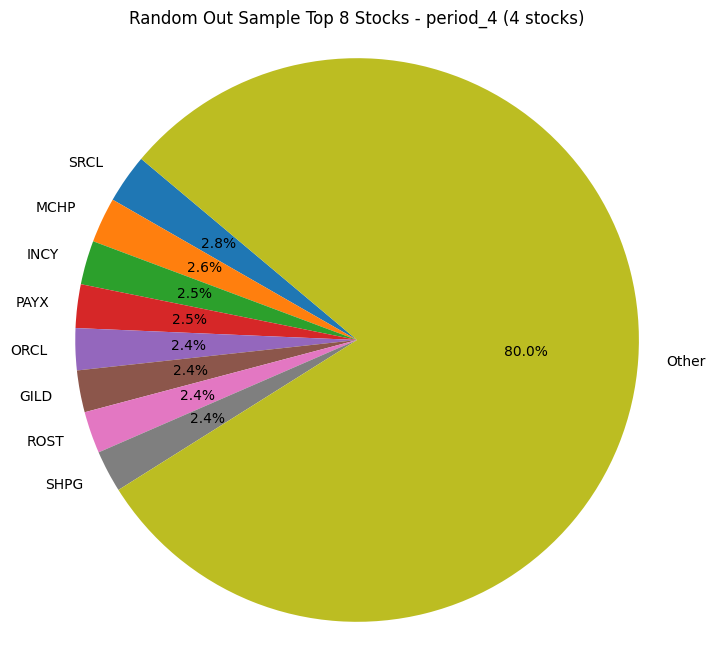

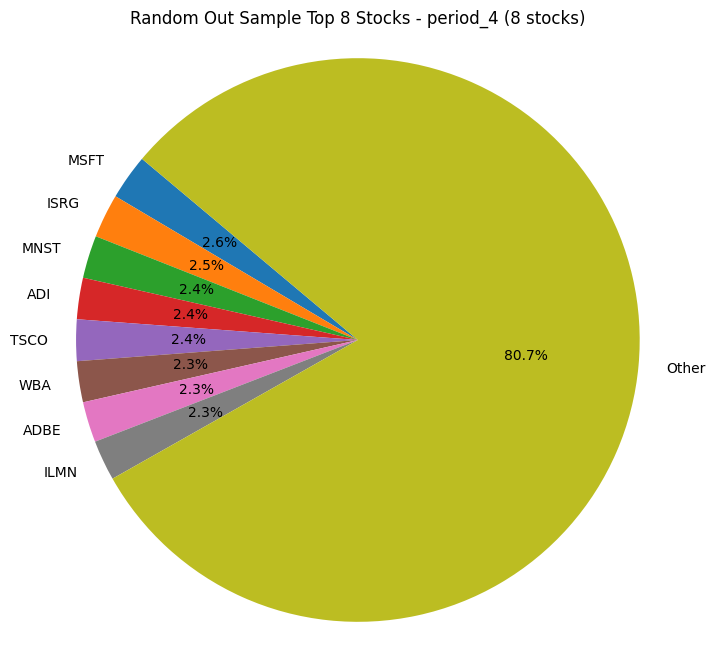

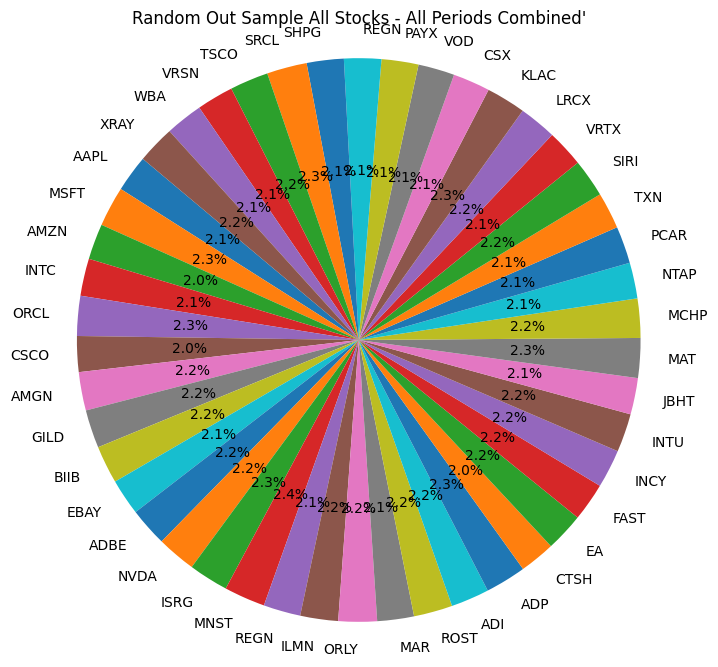

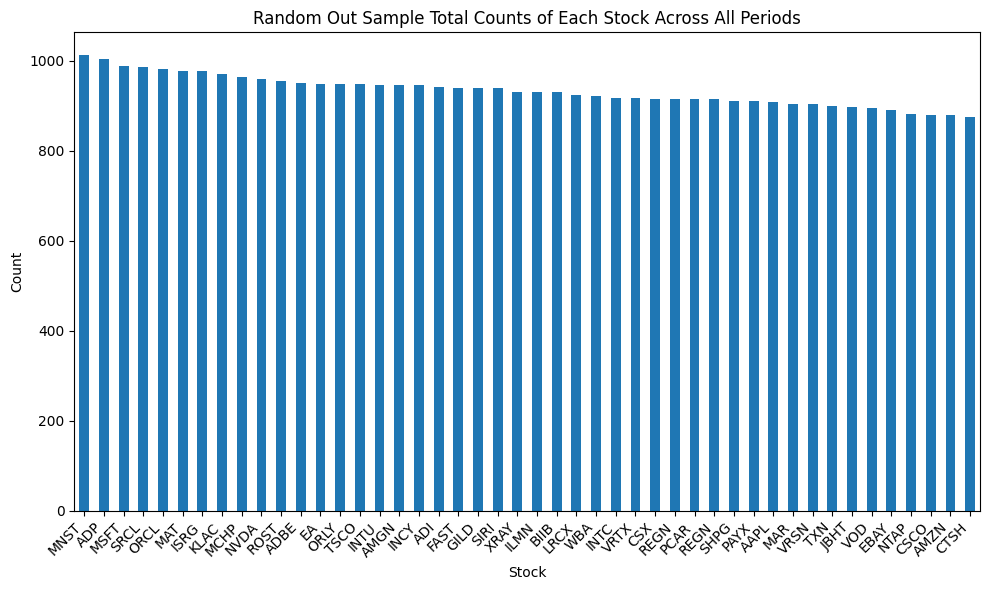

In [78]:
count_of_stocks(result_df_random_test1, custom_tickers, "Random Out Sample")

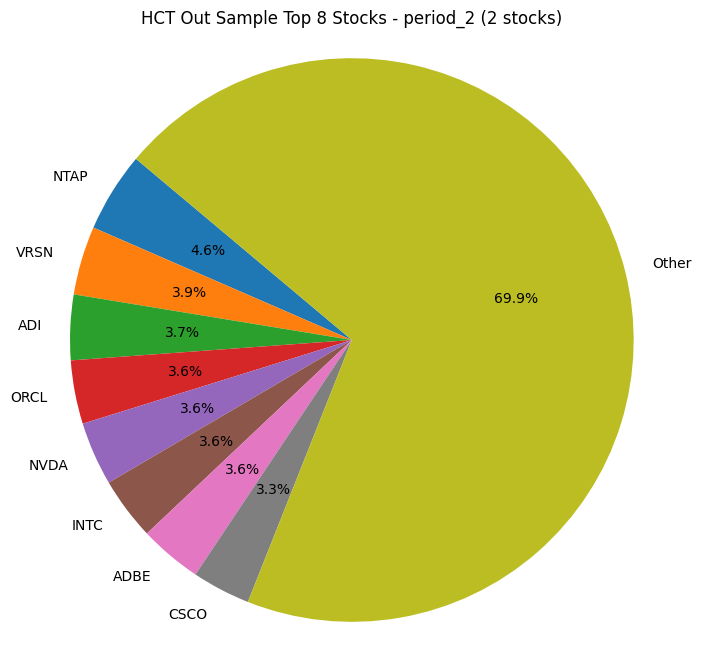

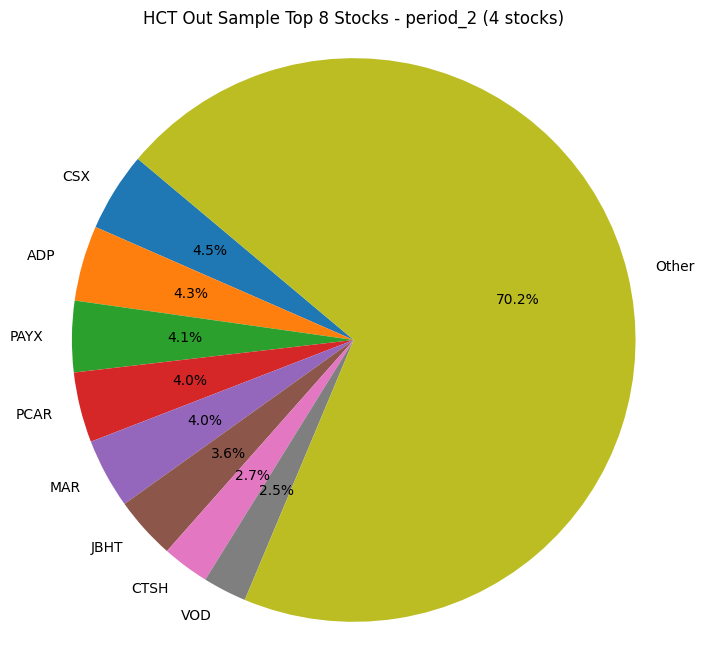

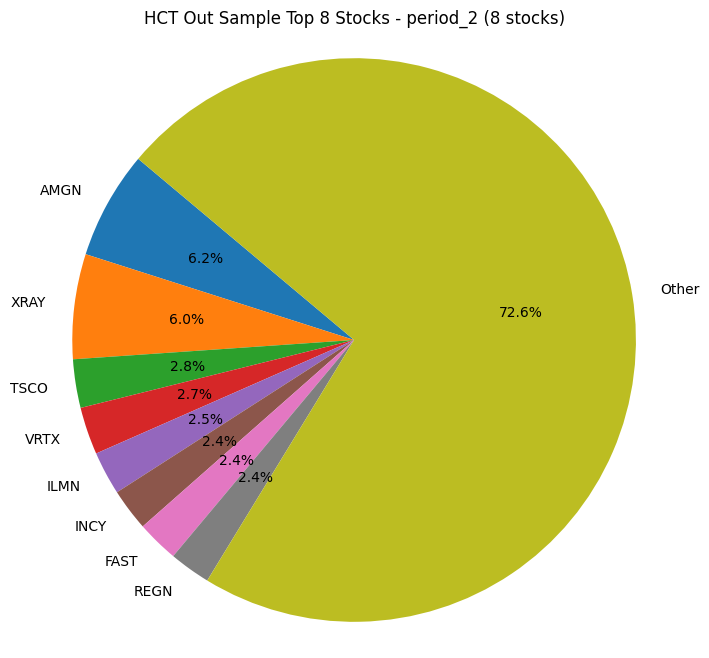

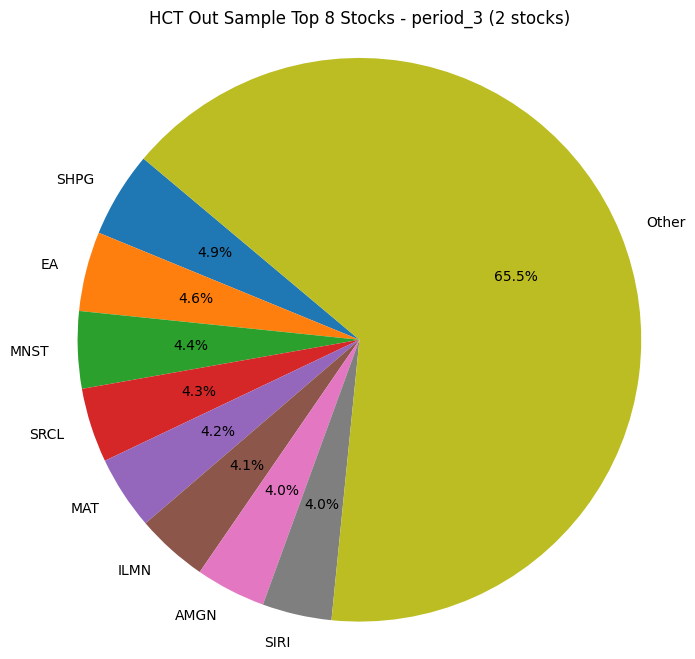

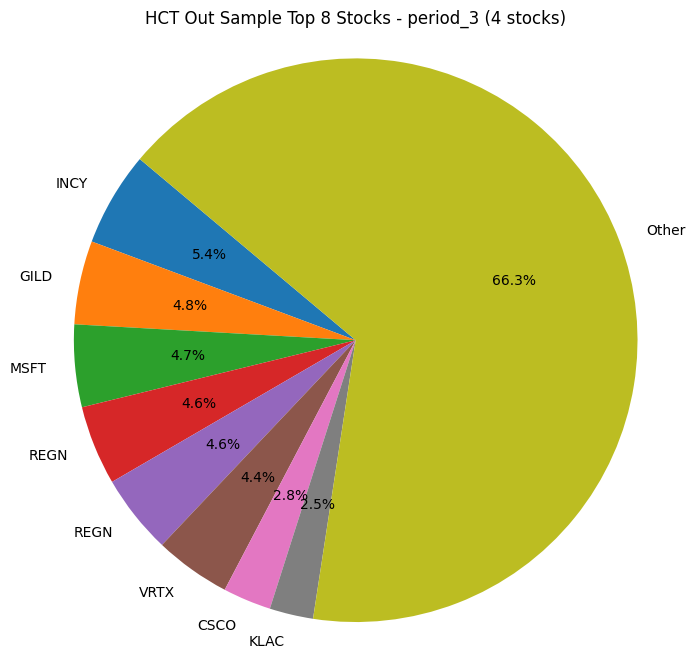

...

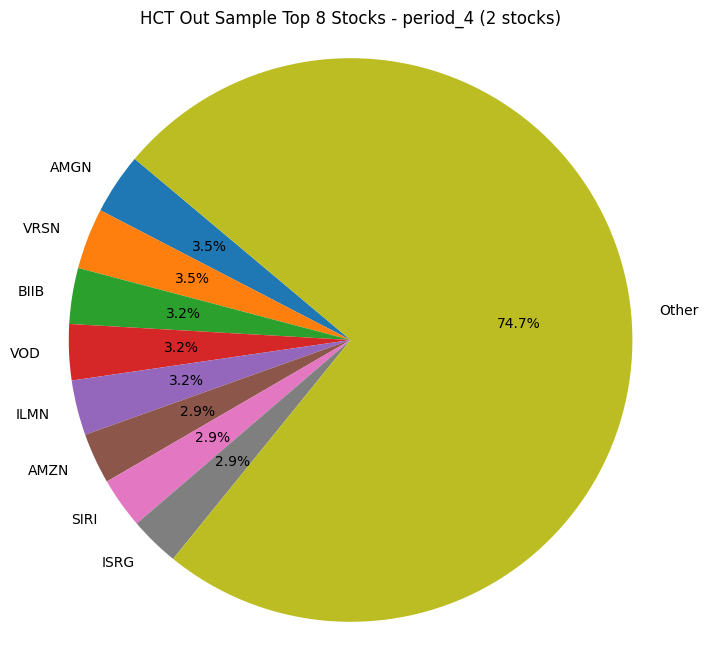

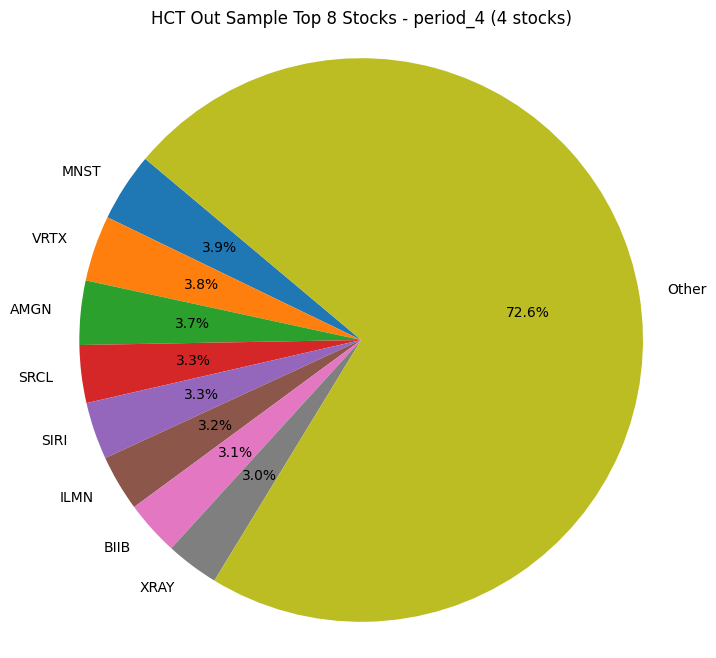

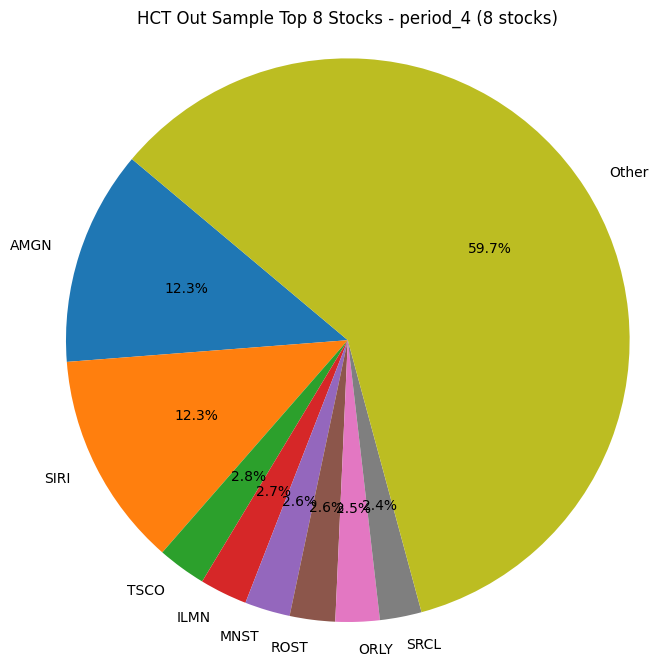

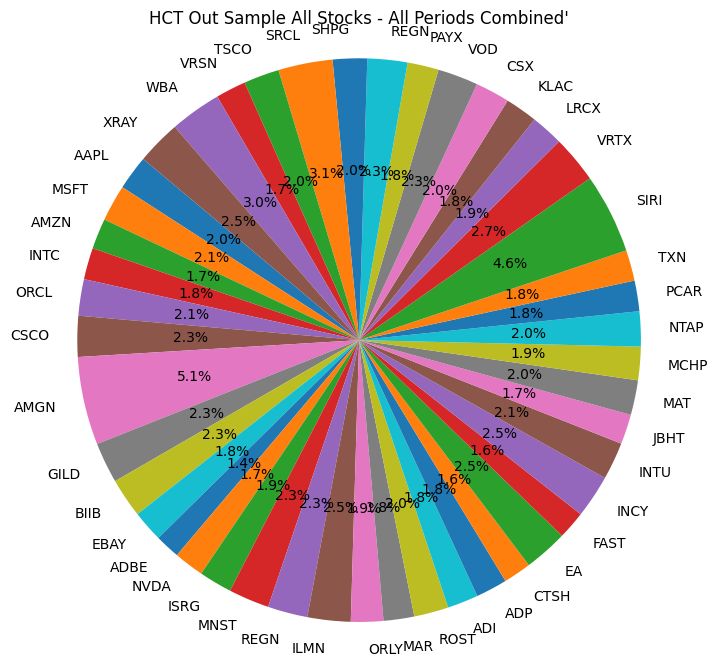

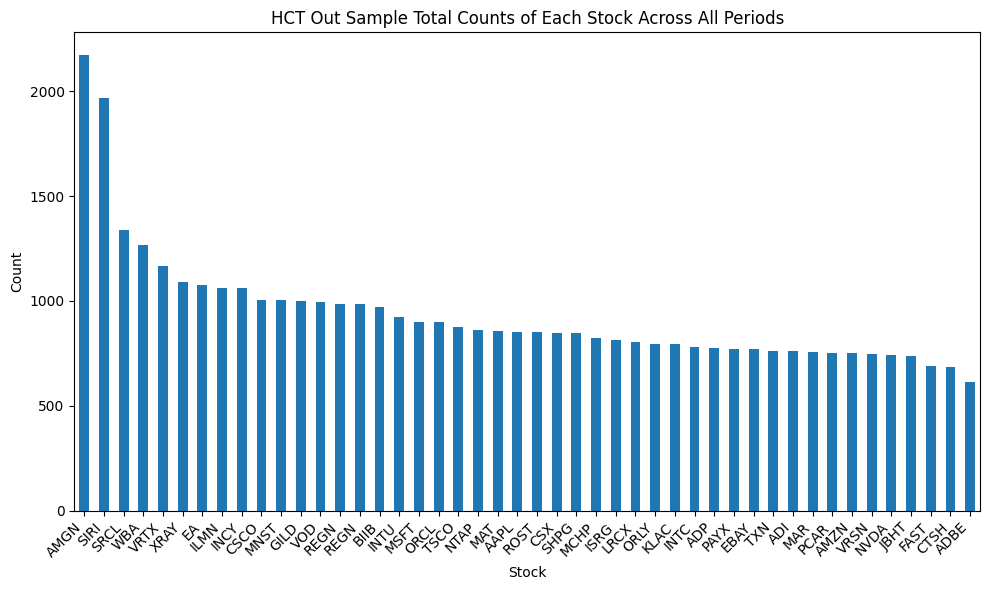

In [79]:
count_of_stocks(result_df_HCT_test1, custom_tickers, "HCT Out Sample")

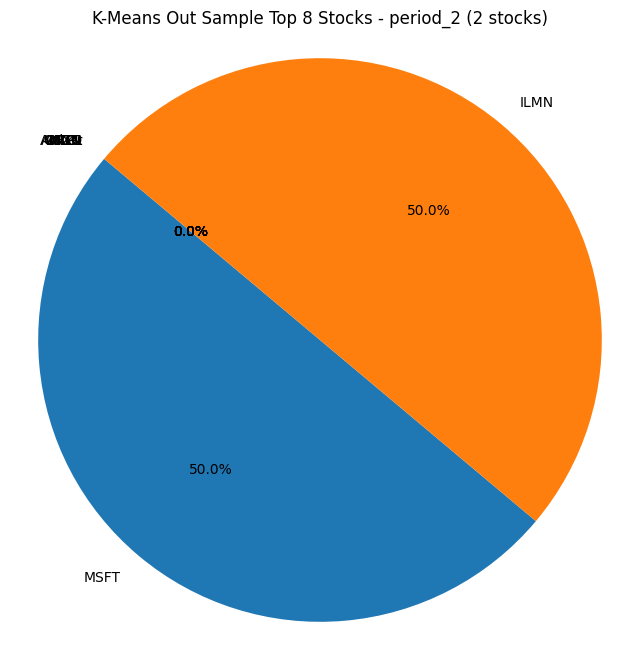

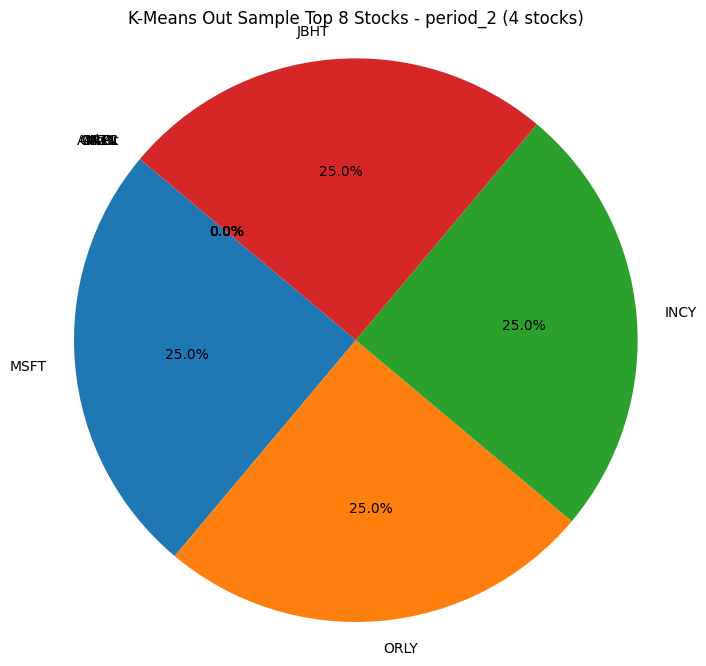

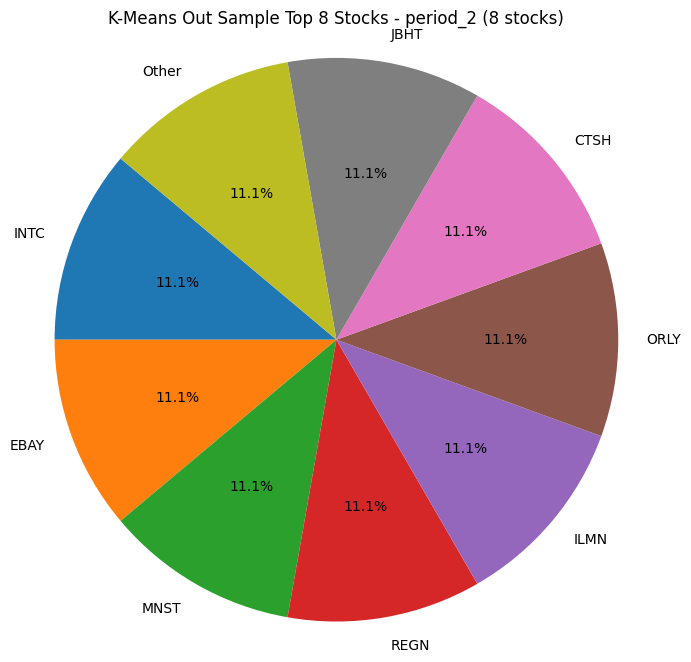

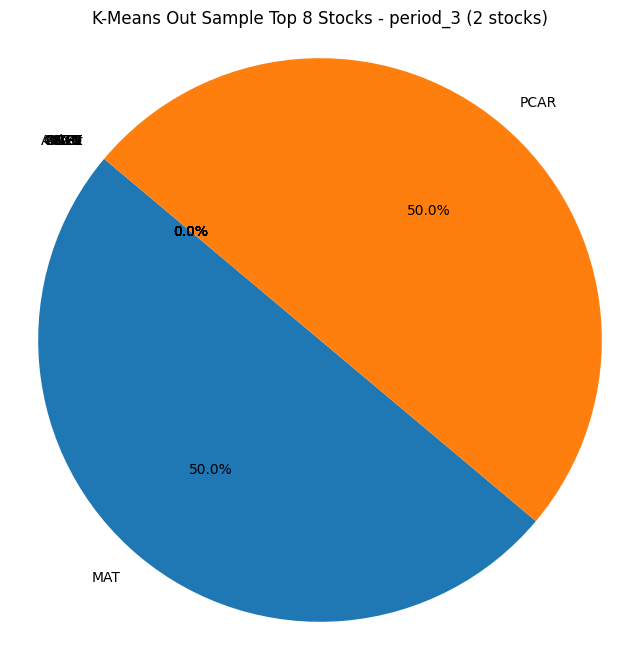

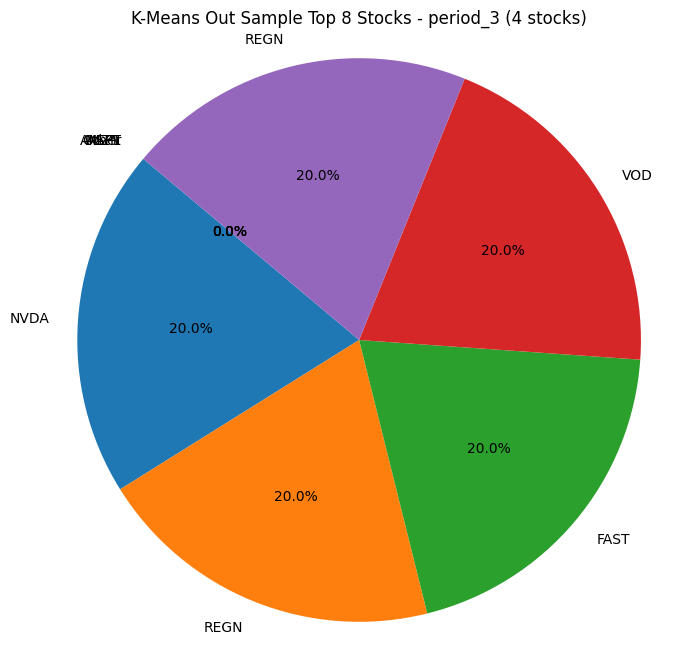

...

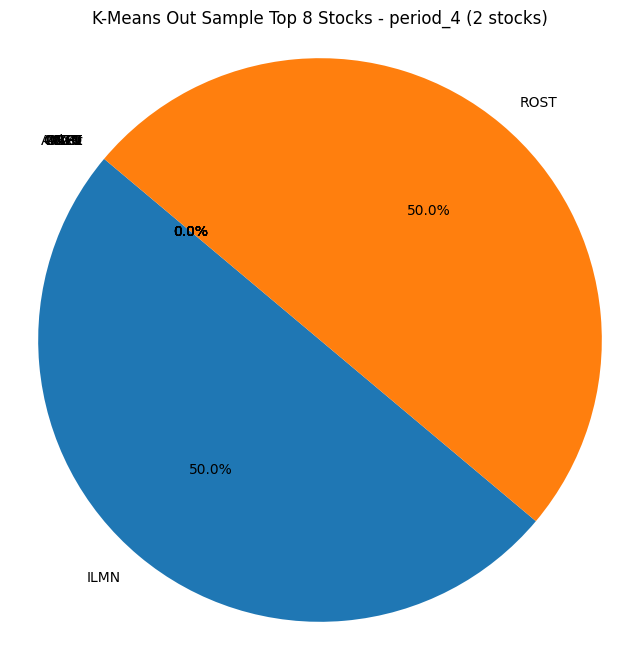

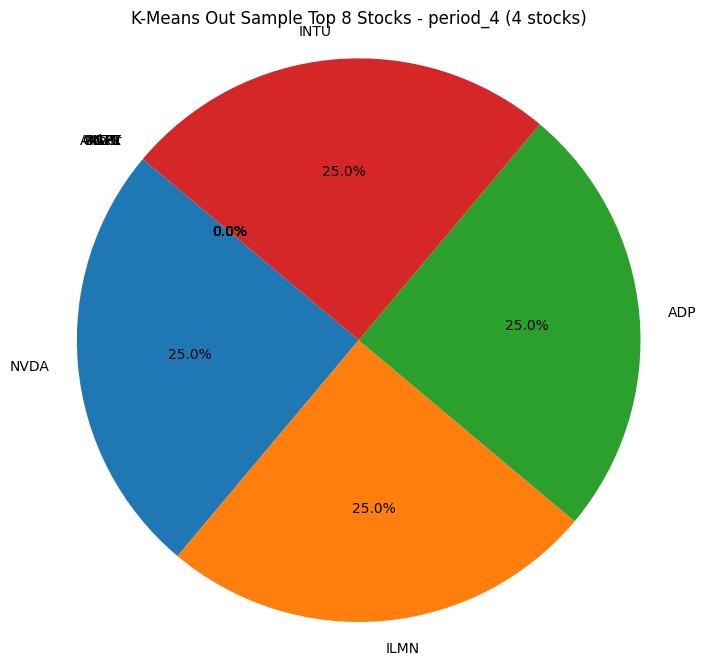

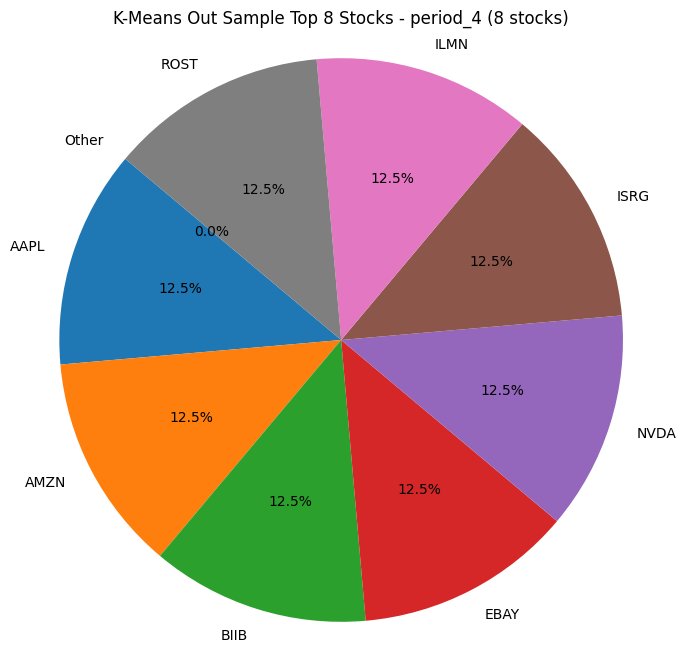

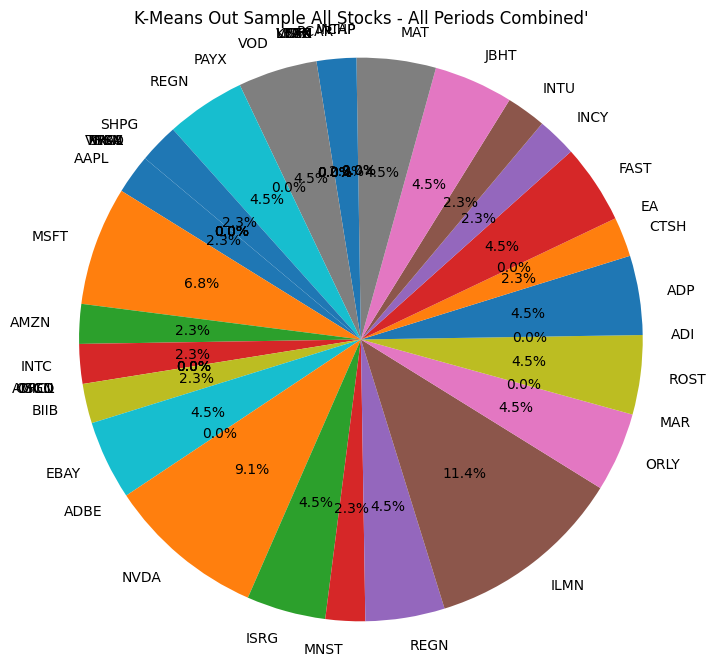

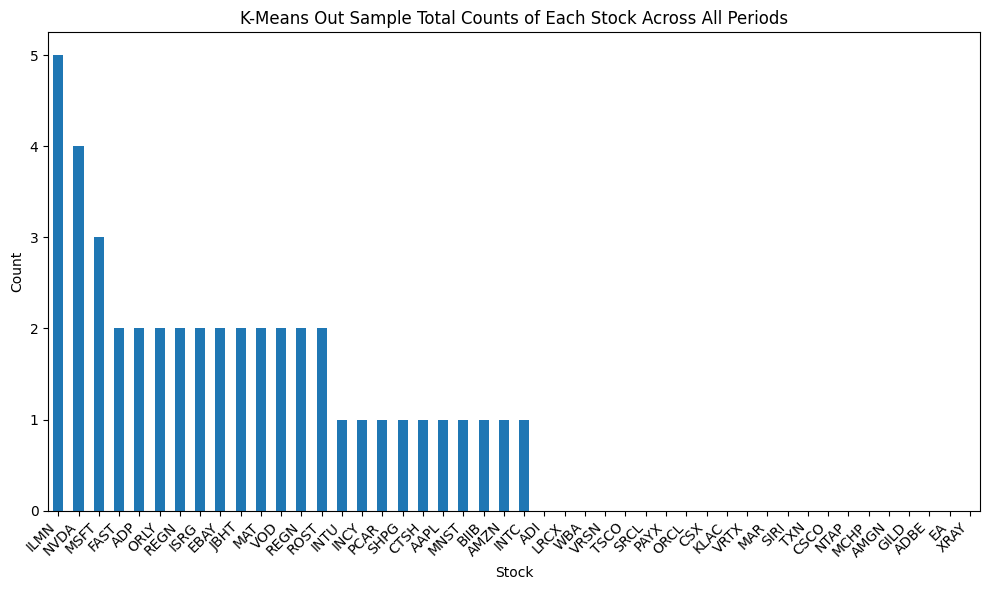

In [80]:
count_of_stocks(result_df_kmeans_test1, custom_tickers, "K-Means Out Sample")

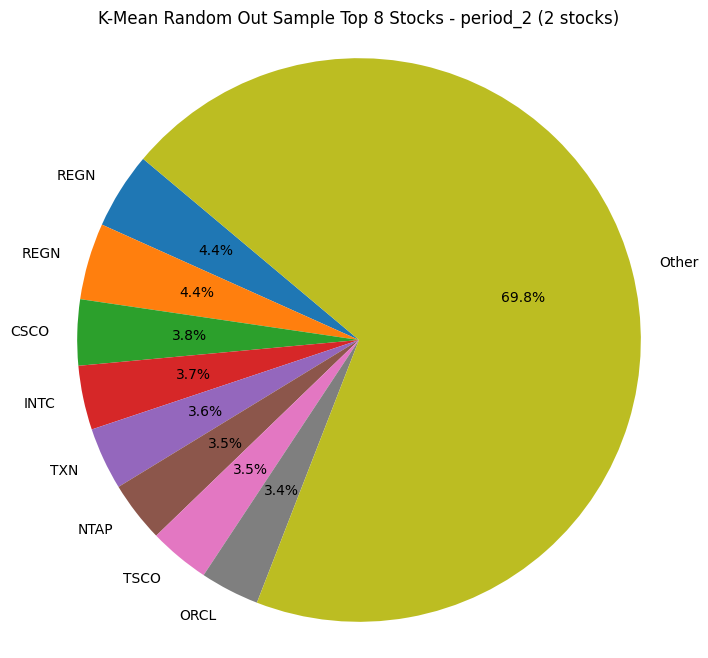

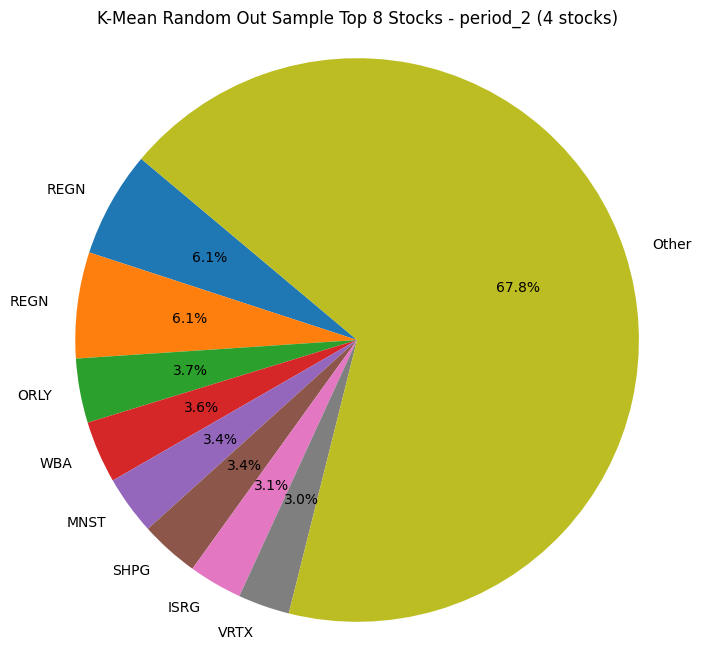

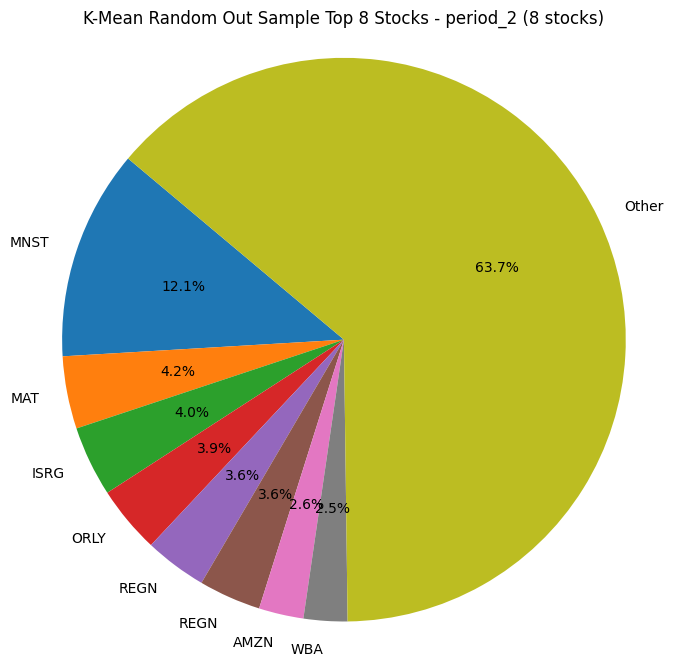

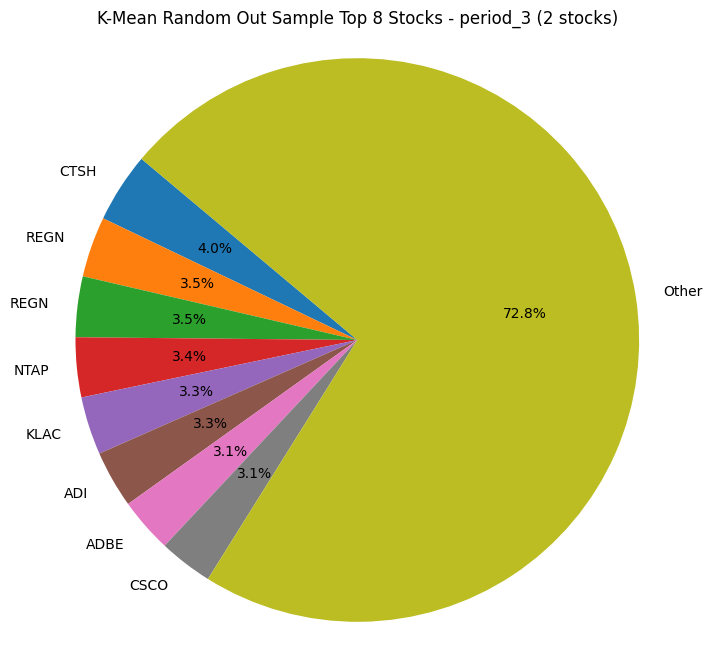

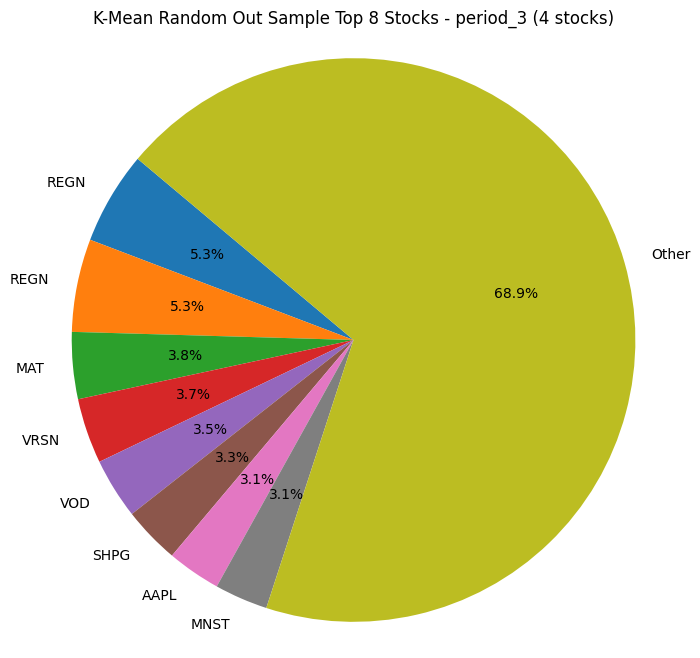

...

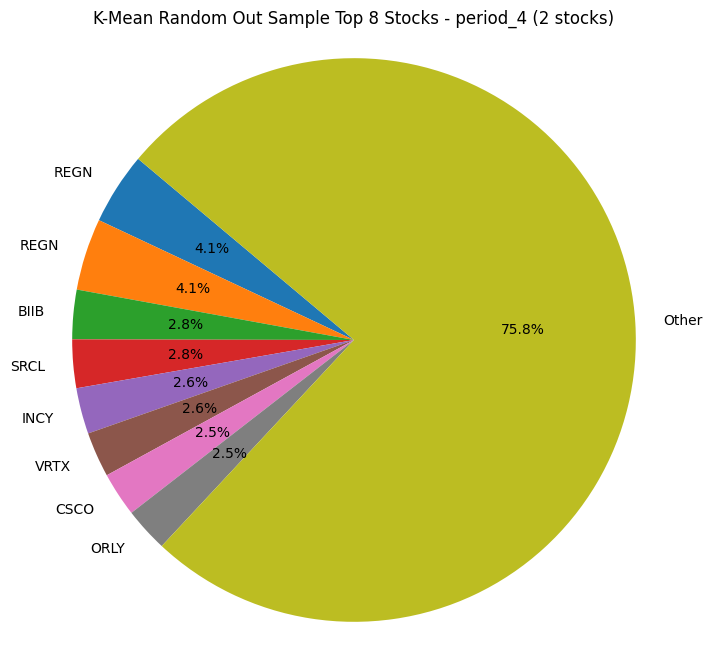

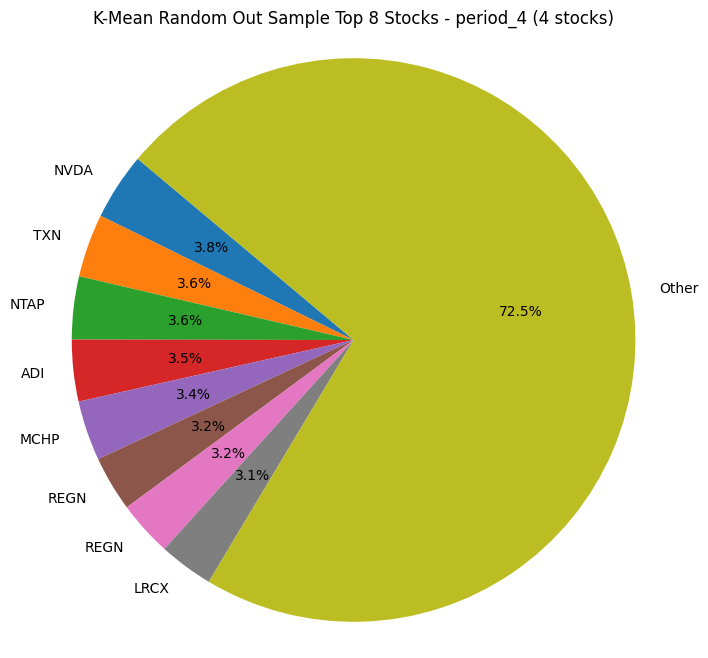

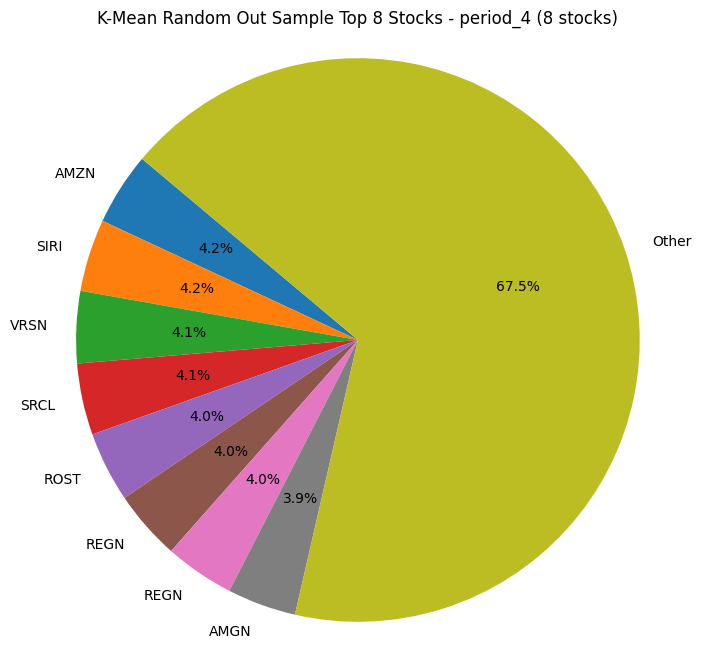

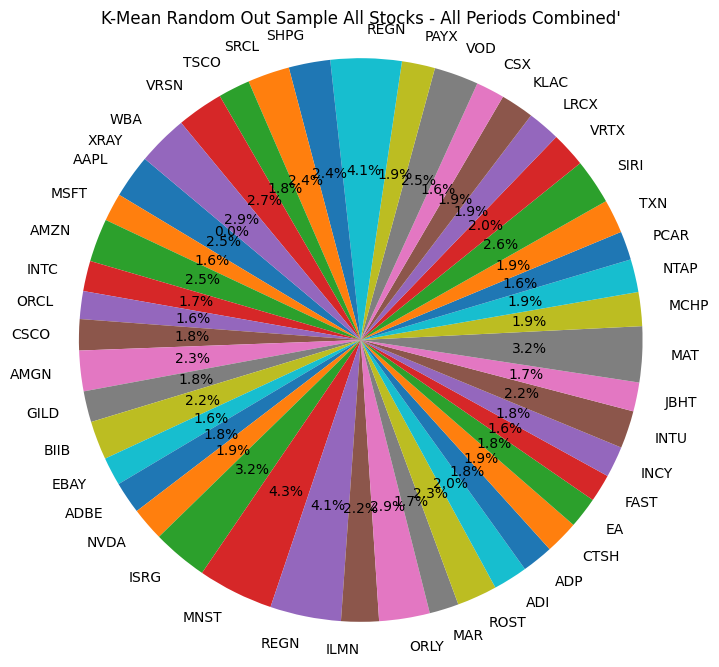

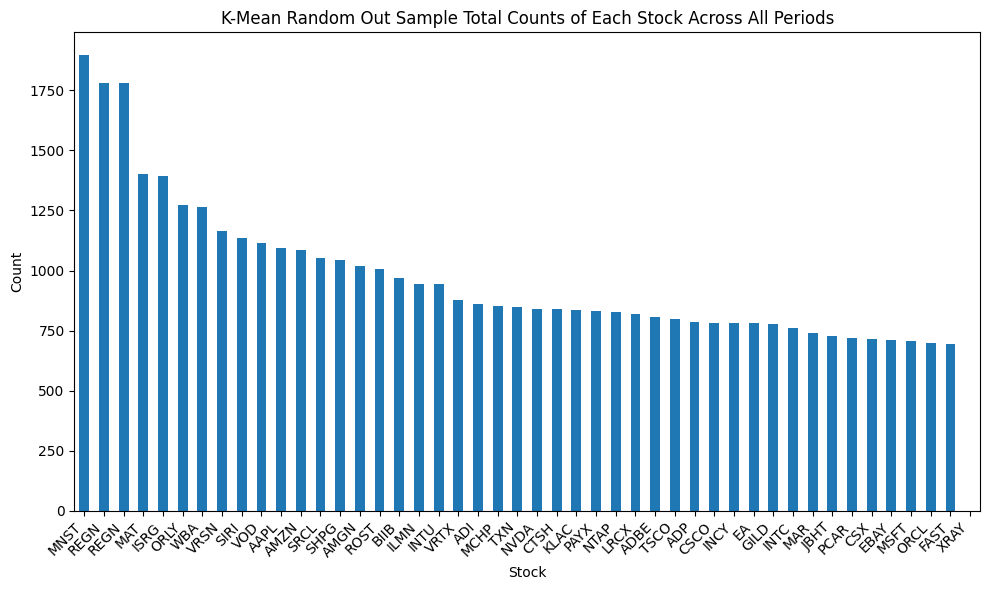

In [81]:
count_of_stocks(result_df_kmeans_rand_test1, custom_tickers, "K-Mean Random Out Sample")

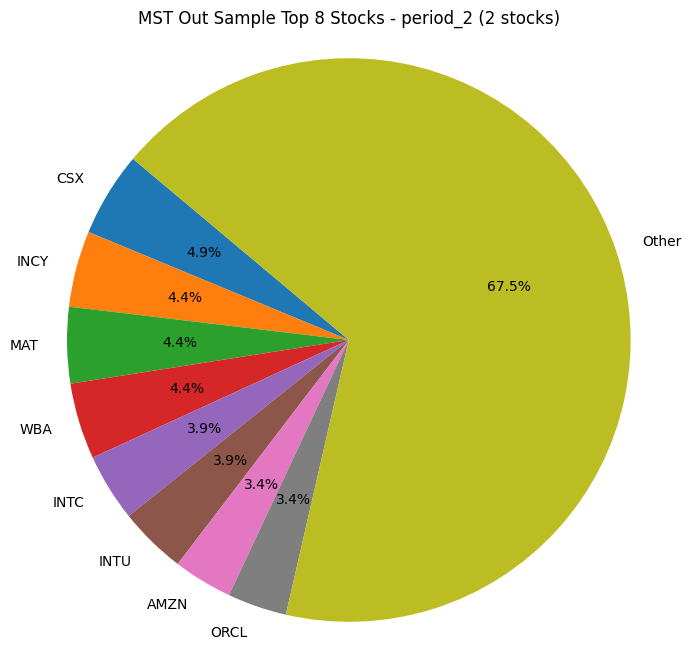

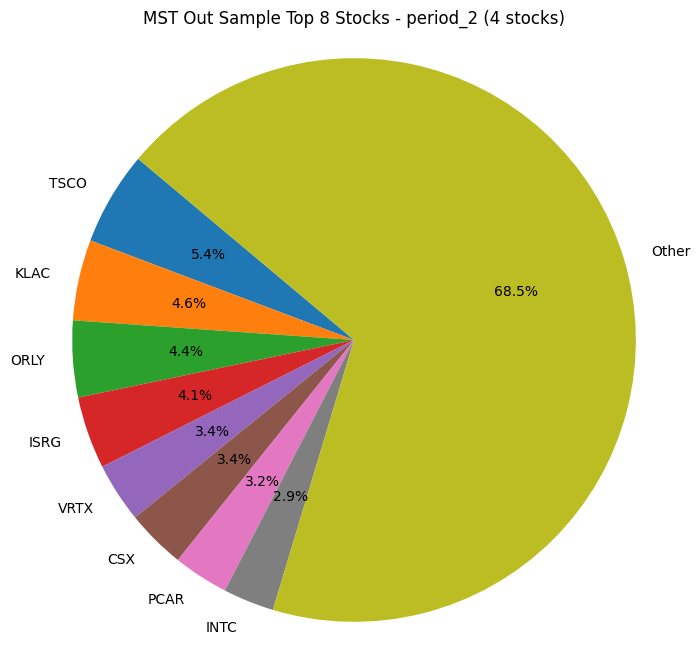

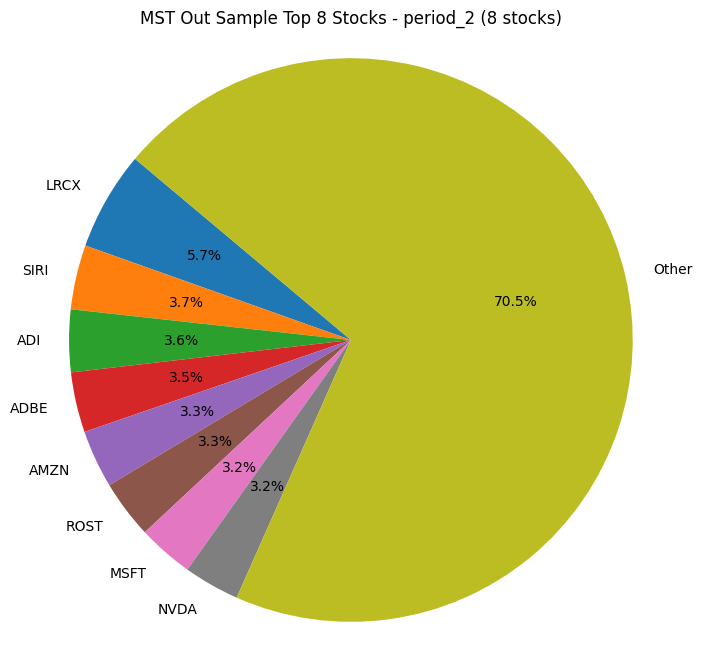

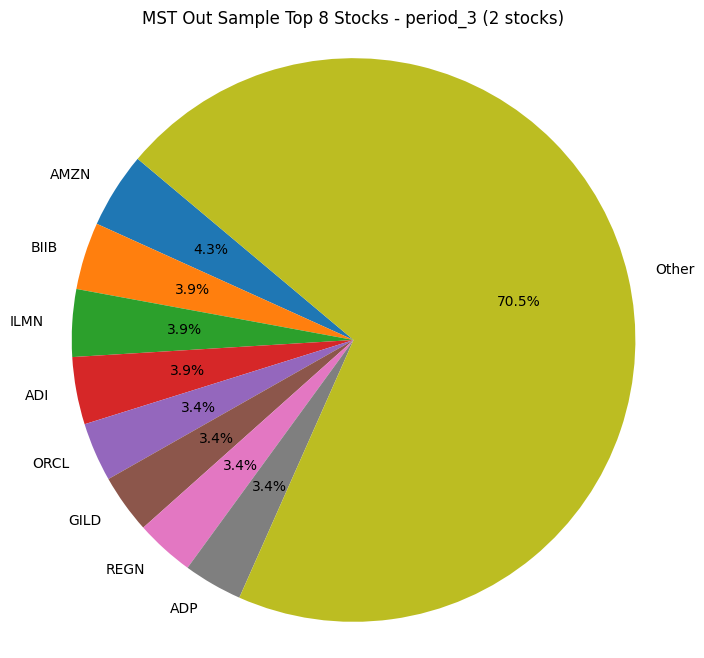

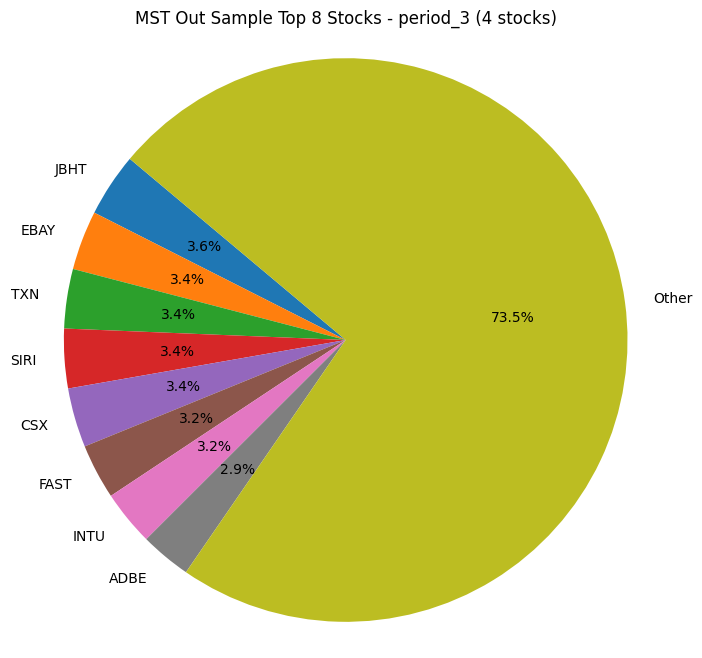

...

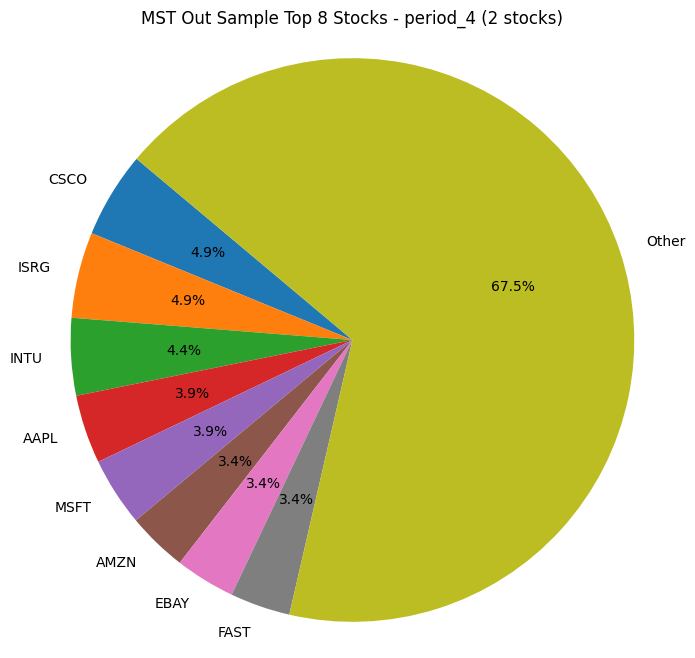

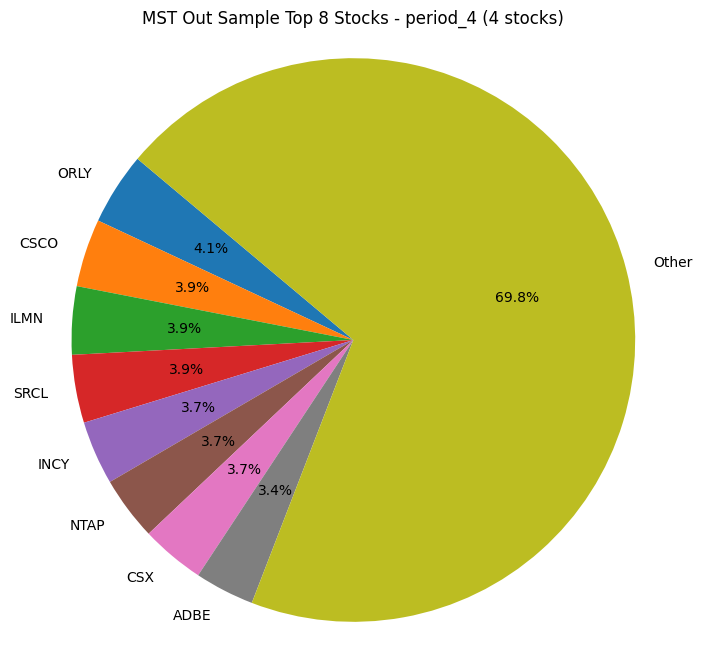

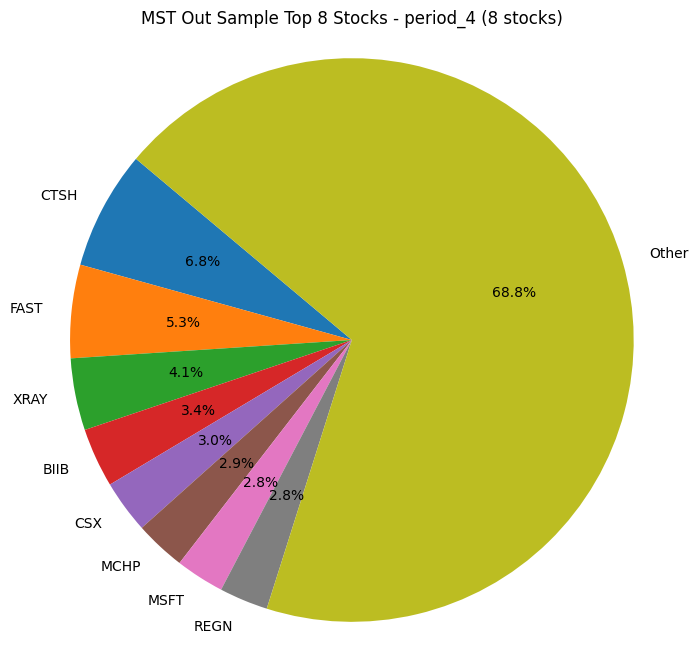

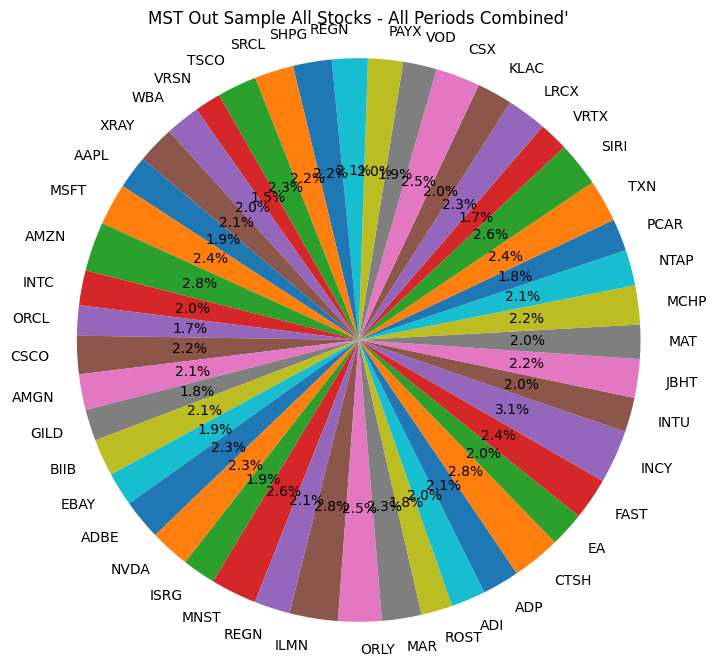

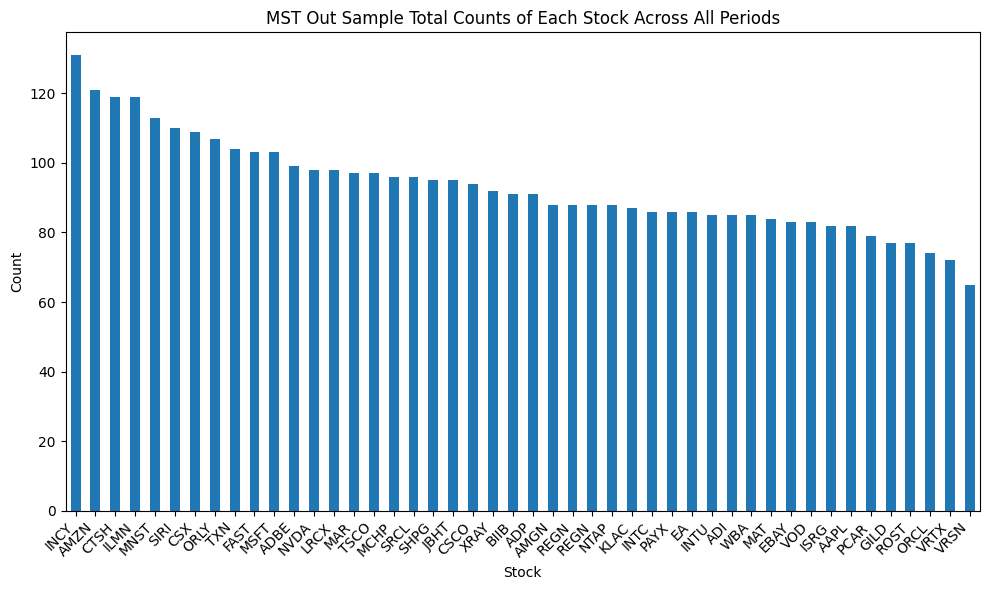

In [82]:
count_of_stocks(mst_result_df_clusters_out_sample, custom_tickers, "MST Out Sample")

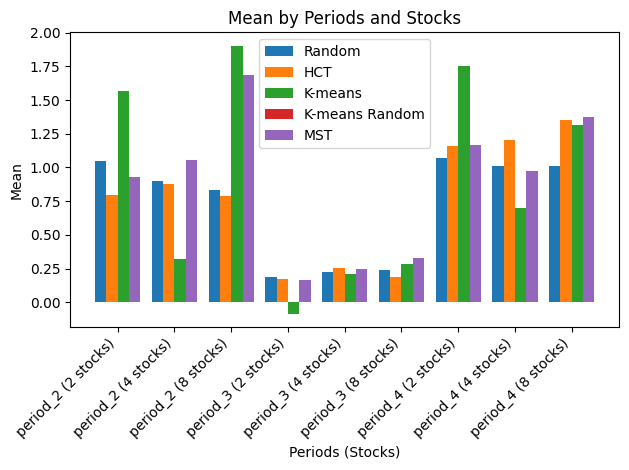

Total Average Mean of Random Values: 0.7256924971158472
Total Average Mean of Cluster Values: 0.7551902180619032
Total Average Mean of K-means Values: 0.8845050181861279
Total Average Mean of K-means Random Values: 0.8808761144912555
Total Average Mean of MST Values: 0.7188506231661393

Period 1 Average Mean of Random Values: 0.9280206146849078
Period 1 Average Mean of Cluster Values: 0.8213361186248559
Period 1 Average Mean of K-means Values: 1.263604088565211
Period 1 Average Mean of K-means Random Values: 1.224687254516762
Period 1 Average Mean of MST: 0.8967530521085006
Period 2 Average Mean of Random Values: 0.21798977517257634
Period 2 Average Mean of Cluster Values: 0.2057471851273798
Period 2 Average Mean of K-means Values: 0.13444303637211252
Period 2 Average Mean of K-means Random Values: 0.24683266185945205
Period 2 Average Mean of MST: 0.25131681731670213
Period 3 Average Mean of Random Values: 1.0310671014900574
Period 3 Average Mean of Cluster Values: 1.2384873504334741
P

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


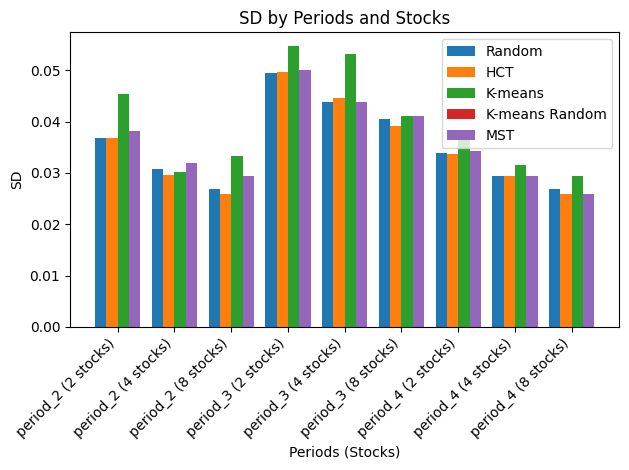

Total Average SD of Random Values: 0.035373748833563784
Total Average SD of Cluster Values: 0.03494000737180504
Total Average SD of K-means Values: 0.03952344874530774
Total Average SD of K-means Random Values: 0.03601694280204953
Total Average SD of MST Values: 0.035807155833902454

Period 1 Average SD of Random Values: 0.03153853525630746
Period 1 Average SD of Cluster Values: 0.03071087184196493
Period 1 Average SD of K-means Values: 0.03626903197971426
Period 1 Average SD of K-means Random Values: 0.03317745122462568
Period 1 Average SD of MST: 0.03179296559094535
Period 2 Average SD of Random Values: 0.04456083561246369
Period 2 Average SD of Cluster Values: 0.044470083462153205
Period 2 Average SD of K-means Values: 0.04957735750976986
Period 2 Average SD of K-means Random Values: 0.04497650652659274
Period 2 Average SD of MST: 0.04524066902399542
Period 3 Average SD of Random Values: 0.030021875631920197
Period 3 Average SD of Cluster Values: 0.029639066811296993
Period 3 Averag

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


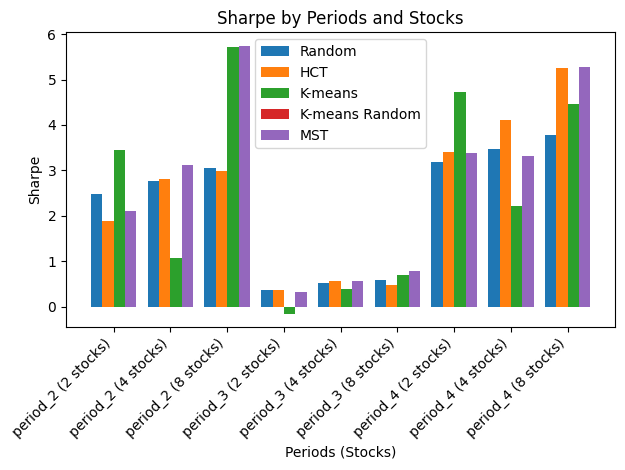

Total Average Sharpe of Random Values: 2.2446036908545226
Total Average Sharpe of Cluster Values: 2.423765821095069
Total Average Sharpe of K-means Values: 2.506566496597022
Total Average Sharpe of K-means Random Values: 2.7351912646897762
Total Average Sharpe of MST Values: 2.202465332515922

Period 1 Average Sharpe of Random Values: 2.7632330538987997
Period 1 Average Sharpe of Cluster Values: 2.556355419178636
Period 1 Average Sharpe of K-means Values: 3.4136168225155643
Period 1 Average Sharpe of K-means Random Values: 3.6551006836941653
Period 1 Average Sharpe of MST: 2.6792316816093416
Period 2 Average Sharpe of Random Values: 0.49085998628534
Period 2 Average Sharpe of Cluster Values: 0.4670489410712053
Period 2 Average Sharpe of K-means Values: 0.30695430201260526
Period 2 Average Sharpe of K-means Random Values: 0.5560387574791582
Period 2 Average Sharpe of MST: 0.5454029759678544
Period 3 Average Sharpe of Random Values: 3.4797180323794272
Period 3 Average Sharpe of Cluster V

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


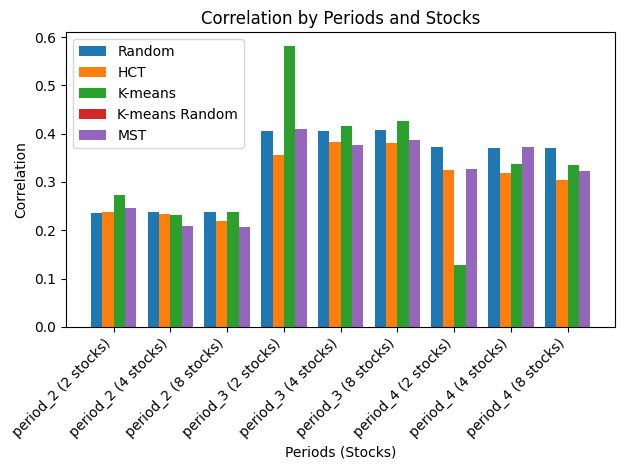

Total Average Correlation of Random Values: 0.33781511513357415
Total Average Correlation of Cluster Values: 0.30656288058814857
Total Average Correlation of K-means Values: 0.3297241437139175
Total Average Correlation of K-means Random Values: 0.317562992617177
Total Average Correlation of MST Values: 0.33657963959111004

Period 1 Average Correlation of Random Values: 0.23689476724519265
Period 1 Average Correlation of Cluster Values: 0.23050519278213588
Period 1 Average Correlation of K-means Values: 0.24762914168645944
Period 1 Average Correlation of K-means Random Values: 0.22116214759955724
Period 1 Average Correlation of MST: 0.23051373363932504
Period 2 Average Correlation of Random Values: 0.4059394626814363
Period 2 Average Correlation of Cluster Values: 0.3729000614186127
Period 2 Average Correlation of K-means Values: 0.47457800779645454
Period 2 Average Correlation of K-means Random Values: 0.39127423610762085
Period 2 Average Correlation of MST: 0.39917601647487366
Period 

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [83]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

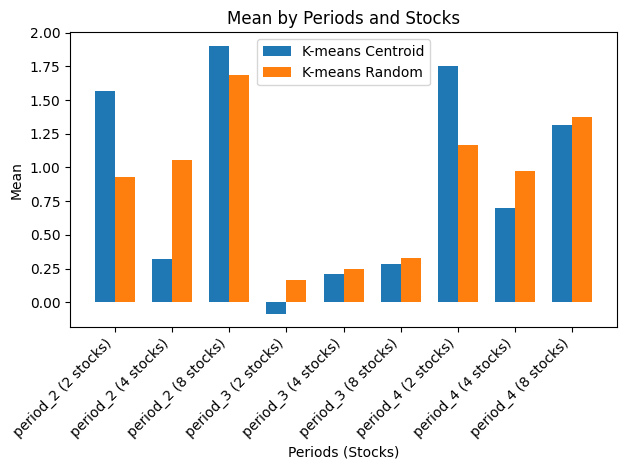

Total Average Mean of K-means Centroid Values: 0.8845050181861279
Total Average Mean of K-means Random Values: 0.8808761144912555

Period 1 Average Mean of K-means Centroid Values: 1.263604088565211
Period 1 Average Mean of K-means Random Values: 1.224687254516762
Period 2 Average Mean of K-means Centroid Values: 0.13444303637211252
Period 2 Average Mean of K-means Random Values: 0.24683266185945205
Period 3 Average Mean of K-means Centroid Values: 1.2554679296210607
Period 3 Average Mean of K-means Random Values: 1.171108427097552


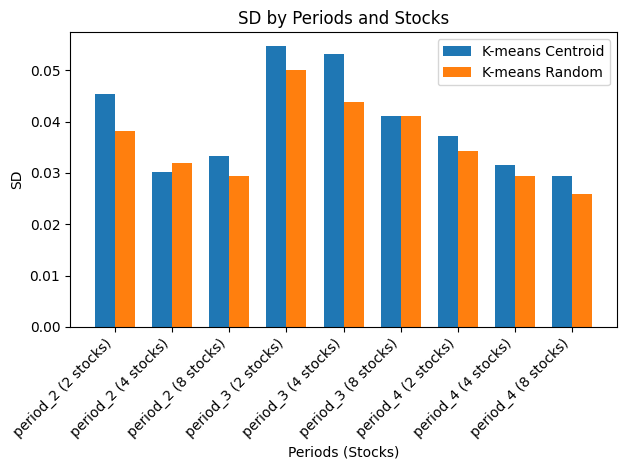

Total Average SD of K-means Centroid Values: 0.03952344874530774
Total Average SD of K-means Random Values: 0.03601694280204953

Period 1 Average SD of K-means Centroid Values: 0.03626903197971426
Period 1 Average SD of K-means Random Values: 0.03317745122462568
Period 2 Average SD of K-means Centroid Values: 0.04957735750976986
Period 2 Average SD of K-means Random Values: 0.04497650652659274
Period 3 Average SD of K-means Centroid Values: 0.032723956746439097
Period 3 Average SD of K-means Random Values: 0.02989687065493016


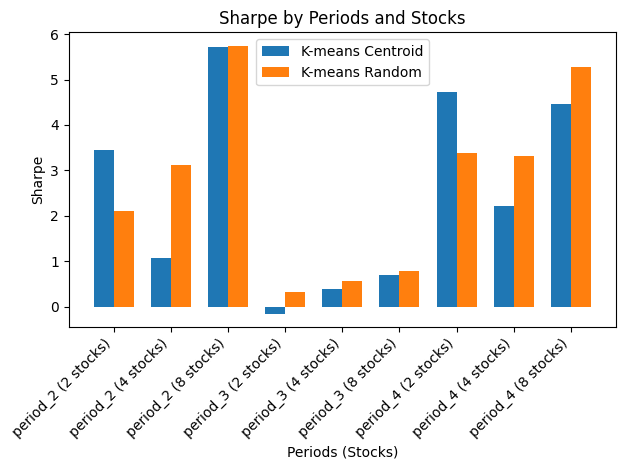

Total Average Sharpe of K-means Centroid Values: 2.506566496597022
Total Average Sharpe of K-means Random Values: 2.7351912646897762

Period 1 Average Sharpe of K-means Centroid Values: 3.4136168225155643
Period 1 Average Sharpe of K-means Random Values: 3.6551006836941653
Period 2 Average Sharpe of K-means Centroid Values: 0.30695430201260526
Period 2 Average Sharpe of K-means Random Values: 0.5560387574791582
Period 3 Average Sharpe of K-means Centroid Values: 3.799128365262895
Period 3 Average Sharpe of K-means Random Values: 3.9944343528960053


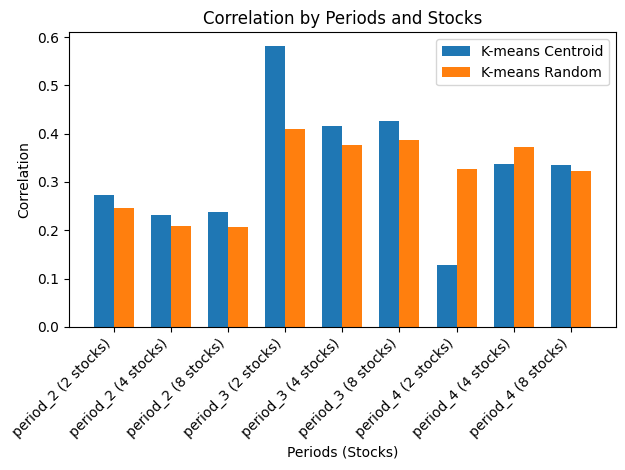

Total Average Correlation of K-means Centroid Values: 0.3297241437139175
Total Average Correlation of K-means Random Values: 0.317562992617177

Period 1 Average Correlation of K-means Centroid Values: 0.24762914168645944
Period 1 Average Correlation of K-means Random Values: 0.22116214759955724
Period 2 Average Correlation of K-means Centroid Values: 0.47457800779645454
Period 2 Average Correlation of K-means Random Values: 0.39127423610762085
Period 3 Average Correlation of K-means Centroid Values: 0.26696528165883837
Period 3 Average Correlation of K-means Random Values: 0.3402525941443529


In [84]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)